# Ecosystem Services Valuation Workflow

Forests and aquatic ecosystems play a regulatory role in the global carbon and water cycles, but are not frequently monitored in a spatially explicit way.  
In this hackathon project, we design and implement a workflow to estimate aboveground forest biomass and map surface-water extent and quality for an area in the Yangtze River Delta.  
Using Sentinel-2 Level-2A imagery accessed via the Copernicus Data Space Ecosystem (CDSE) API, we compute vegetation indices, classify land cover, estimate biomass with simple NDVI-based allometric equations, and detect and characterise water bodies using NDWI, MNDWI, and an NDTI-based turbidity index. 

This notebook follows the 11-phase roadmap from the project.

## 0. Setup
- Activate the `biomass` environment (`conda activate biomass`).
- Update the project path, AOI coordinates, and CDSE credentials in the cells below.
- If needed, please install scipy to run Phase 8. 

### 0.1 Import libraries and load data

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from rasterio.plot import show
from rasterio.mask import mask
from rasterio.warp import calculate_default_transform, reproject
from rasterio.io import MemoryFile
from pathlib import Path
from typing import Optional, Dict, Tuple
from contextlib import ExitStack
from rasterio.merge import merge
from rasterio.enums import Resampling
from rasterio.warp import reproject, Resampling

print("Core libraries imported.")

BAND_SPECS = {
    "B02": {"label": "blue", "folder": "R10m", "suffix": "10m"},
    "B03": {"label": "green", "folder": "R10m", "suffix": "10m"},
    "B04": {"label": "red", "folder": "R10m", "suffix": "10m"},
    "B08": {"label": "nir", "folder": "R10m", "suffix": "10m"},
    "B11": {"label": "swir1", "folder": "R20m", "suffix": "20m"},
    "B12": {"label": "swir2", "folder": "R20m", "suffix": "20m"},
}

SCALING_FACTOR = 10000.0
PIXEL_AREA_HA_10M = 0.01

Core libraries imported.


In [2]:
PROJECT_ROOT = Path.cwd()
DATA_DIR = PROJECT_ROOT / "data"
DATA_DIR.mkdir(exist_ok=True)
print(f"Data directory: {DATA_DIR}")

SAFE_PATTERN = "S2C_MSIL2A_*.SAFE"
SAFE_ROOTS = sorted(DATA_DIR.glob(SAFE_PATTERN))
if not SAFE_ROOTS:
    raise FileNotFoundError(
        f"No Sentinel-2 SAFE directories found via pattern '{SAFE_PATTERN}' in {DATA_DIR}"
    )
print(f"Found {len(SAFE_ROOTS)} SAFE folders inside data/:")
for safe in SAFE_ROOTS:
    print(" •", safe.name)

ANCILLARY_DIR = DATA_DIR / "ancillary"
ANCILLARY_DIR.mkdir(exist_ok=True)
print(f"Ancillary data directory: {ANCILLARY_DIR}")

AOI_PATH = DATA_DIR / "aoi.geojson"
print(f"AOI file detected: {AOI_PATH}")

Data directory: /Users/lmm122/Documents/github/Biomass_fun/data
Found 2 SAFE folders inside data/:
 • S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE
 • S2C_MSIL2A_20251113T024511_N0511_R089_T51RTQ_20251113T054013.SAFE
Ancillary data directory: /Users/lmm122/Documents/github/Biomass_fun/data/ancillary
AOI file detected: /Users/lmm122/Documents/github/Biomass_fun/data/aoi.geojson


### 0.2 Function Support

In [3]:
def load_optional_vector(path: Path) -> Optional[gpd.GeoDataFrame]:
    if not path.exists():
        return None
    gdf = gpd.read_file(path)
    print(f"Loaded vector data from {path} ({len(gdf)} features, CRS={gdf.crs})")
    return gdf.to_crs("EPSG:4326") if gdf.crs else gdf

AOI_GDF = load_optional_vector(AOI_PATH)
if AOI_GDF is None:
    print("AOI_GDF not loaded yet. Provide a GeoJSON/GeoPackage/Shapefile in data/.")
else:
    aoi_projected = AOI_GDF.to_crs("EPSG:32650")  # UTM Zone 50N
    centroid_projected = aoi_projected.geometry.centroid.union_all()
    AOI_CENTROID = gpd.GeoSeries([centroid_projected], crs="EPSG:32650").to_crs("EPSG:4326")[0]
    print(f"AOI centroid: ({AOI_CENTROID.y:.4f}, {AOI_CENTROID.x:.4f})")

def get_granule_dir(safe_dir: Path) -> Path:
    granules = sorted((safe_dir / "GRANULE").iterdir())
    if not granules:
        raise FileNotFoundError(f"No GRANULE directory found in {safe_dir}")
    return granules[0]

def find_band_path(safe_dir: Path, band_id: str) -> Path:
    """Find a band file inside a Sentinel-2 SAFE folder, searching IMG_DATA recursively."""
    spec = BAND_SPECS[band_id]
    granule = get_granule_dir(safe_dir)

    search_root = granule / "IMG_DATA"
    suffix = spec["suffix"]
    pattern = f"*_{band_id}_{suffix}.jp2"

    matches = sorted(search_root.rglob(pattern))
    if not matches:
        raise FileNotFoundError(
            f"Band {band_id} not found in {safe_dir}\n"
            f"Looked under {search_root} with pattern '{pattern}'"
        )

    print(f"{band_id}: using {matches[0].relative_to(safe_dir)}")
    return matches[0]

def find_quality_mask(safe_dir: Path, filename: str) -> Path:
    granule = get_granule_dir(safe_dir)
    candidate = granule / "QI_DATA" / filename
    if not candidate.exists():
        raise FileNotFoundError(f"Quality mask {filename} missing in {safe_dir}")
    return candidate

def resample_to_target(array: np.ndarray, src_transform, src_crs, dst_profile, resampling=Resampling.bilinear):
    """Resample array to match target profile using rasterio reproject"""
    dst_transform = dst_profile["transform"]
    dst_width = dst_profile["width"]
    dst_height = dst_profile["height"]
    dst_crs = dst_profile["crs"]
    
    # Create destination array
    dst_array = np.zeros((dst_height, dst_width), dtype=array.dtype)
    
    reproject(
        source=array,
        destination=dst_array,
        src_transform=src_transform,
        src_crs=src_crs,
        dst_transform=dst_transform,
        dst_crs=dst_crs,
        resampling=resampling
    )
    
    return dst_array

def merge_datasets(paths, dst_profile=None, resampling=Resampling.bilinear):
    """
    Handle tiles in different CRS by forcing common projection
    """
    with ExitStack() as stack:
        datasets = [stack.enter_context(rasterio.open(p)) for p in paths]
        
        crs_list = [src.crs for src in datasets]
        unique_crs = set(crs_list)
        
        if dst_profile is not None and "crs" in dst_profile:
            dst_crs = dst_profile["crs"]
        else:
            dst_crs = max(set(crs_list), key=crs_list.count) if crs_list else datasets[0].crs
        
        reproj_datasets = []
        memfiles = []
        
        for i, src in enumerate(datasets):
            if src.crs == dst_crs:
                reproj_datasets.append(src)
                continue
                
            transform, width, height = calculate_default_transform(
                src.crs, dst_crs, src.width, src.height, *src.bounds
            )
            
            profile = src.profile.copy()
            profile.update({
                'crs': dst_crs,
                'transform': transform,
                'width': width,
                'height': height,
                'nodata': 0
            })
            
            memfile = MemoryFile()
            memfiles.append(memfile)
            dst = memfile.open(**profile)
            stack.enter_context(dst)
            
            reproject(
                source=rasterio.band(src, 1),
                destination=rasterio.band(dst, 1),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=dst_crs,
                resampling=resampling,
                nodata=0
            )
            
            reproj_datasets.append(dst)
        
        mosaic, out_transform = merge(
            reproj_datasets,
            method='first',
            nodata=0,
            resampling=resampling
        )
        
        profile = reproj_datasets[0].profile.copy()
        profile.update({
            'height': mosaic.shape[1],
            'width': mosaic.shape[2],
            'transform': out_transform
        })
        
        return mosaic[0], profile

def load_band(band_id: str, dst_profile=None, resampling=Resampling.bilinear):
    paths = [find_band_path(safe, band_id) for safe in SAFE_ROOTS]
    
    # For 20m bands, first merge at native resolution, then resample
    spec = BAND_SPECS[band_id]
    if spec["suffix"] == "20m" and dst_profile is not None:
        # Merge at native 20m resolution first
        arr_20m, profile_20m = merge_datasets(paths, dst_profile=None, resampling=resampling)
        
        # Then resample to 10m target
        arr_10m = resample_to_target(
            arr_20m, 
            profile_20m["transform"], 
            profile_20m["crs"],
            dst_profile,
            resampling=resampling
        )
        return arr_10m, dst_profile
    else:
        # 10m bands can be merged directly to target
        return merge_datasets(paths, dst_profile=dst_profile, resampling=resampling)

def to_reflectance(array: np.ndarray) -> np.ndarray:
    return (array.astype(np.float32) / SCALING_FACTOR).clip(0, 1.2)

def create_aoi_mask(profile: dict, aoi_gdf: gpd.GeoDataFrame):
    """Create a binary mask for AOI without any file operations"""
    if aoi_gdf is None or aoi_gdf.empty:
        return None
    
    # Ensure AOI is in raster CRS
    aoi_projected = aoi_gdf.to_crs(profile["crs"])
    
    # Create mask directly
    mask_shape = (profile['height'], profile['width'])
    
    aoi_mask = rasterio.features.rasterize(
        [(geom, 1) for geom in aoi_projected.geometry],
        out_shape=mask_shape,
        transform=profile['transform'],
        fill=0,
        all_touched=False,
        dtype=np.uint8
    )
    
    return aoi_mask

def apply_aoi_mask(array: np.ndarray, aoi_mask: np.ndarray):
    """Apply AOI mask to array"""
    if aoi_mask is None:
        return array
    
    if array.ndim == 3:
        if array.shape[0] == 3:  # (bands, height, width)
            return array * aoi_mask  # Broadcasting works
        else:  # (height, width, bands)
            return array * aoi_mask[:, :, np.newaxis]  # Add channel dimension
    else:
        # Single band
        return array * aoi_mask

Loaded vector data from /Users/lmm122/Documents/github/Biomass_fun/data/aoi.geojson (1 features, CRS=EPSG:4326)
AOI centroid: (31.1209, 119.8241)


## Phase 1: Data Loading & Preprocessing

Here we download the data and do basic preprocessing removing cloud data. 

In [4]:
# Load reference band
reference_red, reference_profile = load_band("B04")
REFERENCE_PROFILE = {
    "transform": reference_profile["transform"],
    "crs": reference_profile["crs"],
    "width": reference_profile["width"],
    "height": reference_profile["height"],
}

# Load all bands with consistent resolution
BAND_DATA: Dict[str, np.ndarray] = {"red": to_reflectance(reference_red)}
for band_id, spec in BAND_SPECS.items():
    if spec["label"] == "red":
        continue
    arr, _ = load_band(band_id, dst_profile=reference_profile)
    BAND_DATA[spec["label"]] = to_reflectance(arr)

# Load cloud probability (20m → 10m)
cloud_probability_paths = [find_quality_mask(safe, "MSK_CLDPRB_20m.jp2") for safe in SAFE_ROOTS]
cloud_prob_raw, cloud_prob_profile = merge_datasets(
    cloud_probability_paths,
    dst_profile=None,  # Merge at native 20m first
    resampling=Resampling.bilinear,
)
cloud_probability = resample_to_target(
    cloud_prob_raw.astype(np.float32),
    cloud_prob_profile["transform"],
    cloud_prob_profile["crs"], 
    reference_profile,
    resampling=Resampling.bilinear
)

# Load SCL (20m → 10m)
scl_paths = [find_quality_mask(safe, "MSK_CLASSI_B00.jp2") for safe in SAFE_ROOTS]
scl_raw, scl_profile = merge_datasets(
    scl_paths,
    dst_profile=None,  # Merge at native 20m first
    resampling=Resampling.nearest,
)
SCL = resample_to_target(
    scl_raw.astype(np.uint8),
    scl_profile["transform"],
    scl_profile["crs"],
    reference_profile,
    resampling=Resampling.nearest  # Nearest neighbor for categorical
)

B04: using GRANULE/L2A_T50RQV_A006208_20251113T024512/IMG_DATA/R10m/T50RQV_20251113T024511_B04_10m.jp2
B04: using GRANULE/L2A_T51RTQ_A006208_20251113T024512/IMG_DATA/R10m/T51RTQ_20251113T024511_B04_10m.jp2
B02: using GRANULE/L2A_T50RQV_A006208_20251113T024512/IMG_DATA/R10m/T50RQV_20251113T024511_B02_10m.jp2
B02: using GRANULE/L2A_T51RTQ_A006208_20251113T024512/IMG_DATA/R10m/T51RTQ_20251113T024511_B02_10m.jp2
B03: using GRANULE/L2A_T50RQV_A006208_20251113T024512/IMG_DATA/R10m/T50RQV_20251113T024511_B03_10m.jp2
B03: using GRANULE/L2A_T51RTQ_A006208_20251113T024512/IMG_DATA/R10m/T51RTQ_20251113T024511_B03_10m.jp2
B08: using GRANULE/L2A_T50RQV_A006208_20251113T024512/IMG_DATA/R10m/T50RQV_20251113T024511_B08_10m.jp2
B08: using GRANULE/L2A_T51RTQ_A006208_20251113T024512/IMG_DATA/R10m/T51RTQ_20251113T024511_B08_10m.jp2
B11: using GRANULE/L2A_T50RQV_A006208_20251113T024512/IMG_DATA/R20m/T50RQV_20251113T024511_B11_20m.jp2
B11: using GRANULE/L2A_T51RTQ_A006208_20251113T024512/IMG_DATA/R20m/T51RT

In [5]:
stack_for_mask = np.stack(list(BAND_DATA.values()), axis=0)
nodata_mask = np.any(stack_for_mask <= 0.0, axis=0)
cloud_mask = cloud_probability >= 40  # % probability threshold
scl_cloud = np.isin(SCL, [3, 8, 9, 10, 11])
valid_mask = ~(nodata_mask | cloud_mask | scl_cloud)

MASKS = {
    "nodata": nodata_mask,
    "cloud_prob": cloud_mask,
    "scl_cloud": scl_cloud,
    "valid": valid_mask,
    "cloud_probability": cloud_probability,
    "scl": SCL,
}

print(
    "Loaded bands:", ", ".join(sorted(BAND_DATA.keys())),
    "| valid pixels:", int(valid_mask.sum()),
)

Loaded bands: blue, green, nir, red, swir1, swir2 | valid pixels: 197875344


In [6]:
height, width = BAND_DATA['red'].shape
start_y, start_x = height // 4, width // 4  # Start from 25% in

new_sets = []
for colour in ["red", "green", "blue"]:
    expanded_set = np.expand_dims(BAND_DATA[colour], axis=-1)
    new_sets.append(expanded_set)
rgb = np.concatenate(new_sets, axis=-1)

new_sets = []
for colour in ["nir", "swir1", "swir2"]:
    expanded_set = np.expand_dims(BAND_DATA[colour], axis=-1)
    new_sets.append(expanded_set)
ns1s2 = np.concatenate(new_sets, axis=-1)

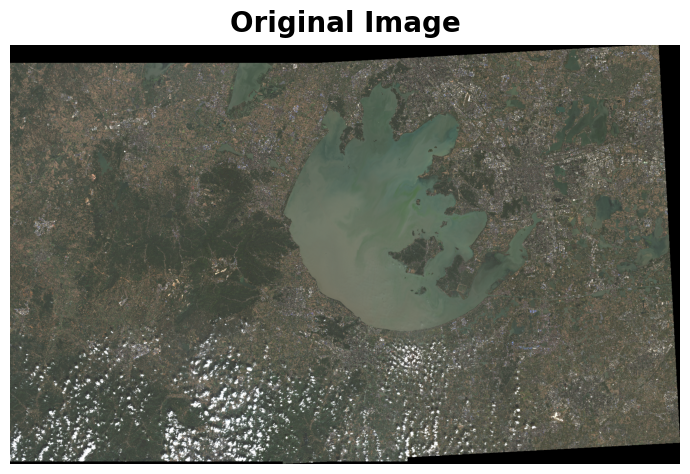

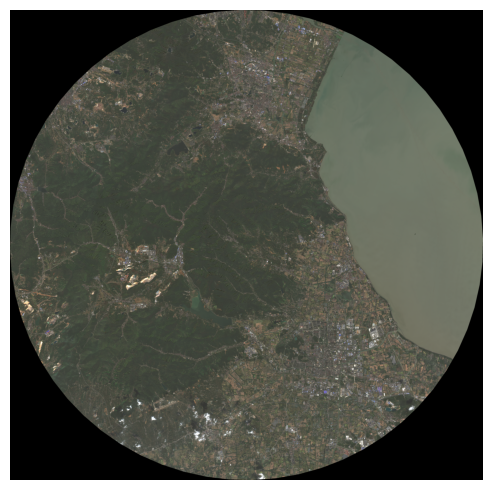

In [7]:
aoi_mask = create_aoi_mask(reference_profile, AOI_GDF)
mask_size = aoi_mask.shape
sub_dims = [(int(0.25*mask_size[0]), int(0.75*mask_size[0])), (int(0.225*mask_size[1]), int(0.55*mask_size[1]))]

def stretch_contrast(rgb_data, percentile=99):
    """Simple contrast stretch for better visualization"""
    p_max = np.percentile(rgb_data[rgb_data > 0], percentile) if (rgb_data > 0).any() else 1.0
    return np.clip(rgb_data / p_max, 0, 1)

rgb_masked_ = apply_aoi_mask(rgb, aoi_mask)

row_sums, col_sums = np.sum(rgb_masked_[:,:,0], axis=1).flatten(), np.sum(rgb_masked_[:,:,0], axis=0).flatten()
rnz, cnz = np.where(row_sums > 0)[0], np.where(col_sums > 0)[0]

# Remove rows and columns that sum 0
v1 = int(rnz[0] if len(rnz) > 0 else 0)
v2 = next((i for i in range(v1, len(row_sums)) if row_sums[i] == 0), len(row_sums))

v3 = int(cnz[0] if len(cnz) > 0 else 0)
v4 = next((i for i in range(v3, len(col_sums)) if col_sums[i] == 0), len(col_sums))

sub_dims = [(v1, v2), (v3, v4)]

rgb_masked = rgb_masked_[sub_dims[0][0]:sub_dims[0][1], sub_dims[1][0]:sub_dims[1][1]]
ns1s2_masked = apply_aoi_mask(ns1s2, aoi_mask)[sub_dims[0][0]:sub_dims[0][1], sub_dims[1][0]:sub_dims[1][1]]

BAND_DATA_MASKED = {}
for band_name, band_array in BAND_DATA.items():
    BAND_DATA_MASKED[band_name] = apply_aoi_mask(band_array, aoi_mask)[sub_dims[0][0]:sub_dims[0][1], sub_dims[1][0]:sub_dims[1][1]]

cloud_probability_masked = apply_aoi_mask(cloud_probability, aoi_mask)[sub_dims[0][0]:sub_dims[0][1], sub_dims[1][0]:sub_dims[1][1]]
SCL_masked = apply_aoi_mask(SCL, aoi_mask)[sub_dims[0][0]:sub_dims[0][1], sub_dims[1][0]:sub_dims[1][1]]

plt.figure(figsize=(7, 5))
rgb_display_orig = stretch_contrast(rgb)
plt.imshow(rgb_display_orig[::10, ::10])
plt.title("Original Image", fontsize=20, fontweight='bold', pad=10)
plt.axis('off')

plt.tight_layout()
plt.show()

plt.figure(figsize=(6, 5))
rgb_display_masked = apply_aoi_mask(rgb_display_orig, aoi_mask)[sub_dims[0][0]:sub_dims[0][1], sub_dims[1][0]:sub_dims[1][1]]
plt.imshow(rgb_display_masked)
plt.axis('off')

plt.tight_layout()
plt.savefig('img/area_of_interest.pdf', bbox_inches='tight')

plt.show()

## Phase 2: Vegetation Indices

### 2.1 Functions

In [8]:
def calculate_ndvi(red_band: np.ndarray, nir_band: np.ndarray, epsilon: float = 1e-8) -> np.ndarray:
    """    
    Formula: NDVI = (NIR - Red) / (NIR + Red + epsilon)
    Range: -1 to 1
    """
    numerator = nir_band - red_band
    denominator = nir_band + red_band + epsilon  # Add epsilon to avoid division by zero
    
    ndvi = numerator / denominator
    return np.clip(ndvi, -1.0, 1.0)  # Clip to valid range


def calculate_evi(red_band: np.ndarray, nir_band: np.ndarray, blue_band: np.ndarray, 
                  epsilon: float = 1e-8) -> np.ndarray:
    """    
    Formula: EVI = 2.5 * (NIR - Red) / (NIR + 6*Red - 7.5*Blue + 1 + epsilon)
    Coefficients: Standard MODIS EVI coefficients (G=2.5, C1=6, C2=7.5, L=1)
    Range: -1 to 1
    """
    numerator = nir_band - red_band
    denominator = nir_band + 6.0 * red_band - 7.5 * blue_band + 1.0 + epsilon
    
    evi = 2.5 * (numerator / denominator)
    return np.clip(evi, -1.0, 1.0)  # Clip to valid range


def calculate_savi(red_band: np.ndarray, nir_band: np.ndarray, 
                   soil_adjustment: float = 0.5, epsilon: float = 1e-8) -> np.ndarray:
    """
    Calculate Soil Adjusted Vegetation Index (SAVI).
    
    Formula: SAVI = (NIR - Red) / (NIR + Red + L) * (1 + L)
    L = soil adjustment factor (typically 0.5 for sparse vegetation)
    Range: -1 to 1
    """
    numerator = nir_band - red_band
    denominator = nir_band + red_band + soil_adjustment + epsilon
    
    savi = (numerator / denominator) * (1.0 + soil_adjustment)
    return np.clip(savi, -1.0, 1.0)  # Clip to valid range

Vegetation indices calculated
Generating vegetation index maps...


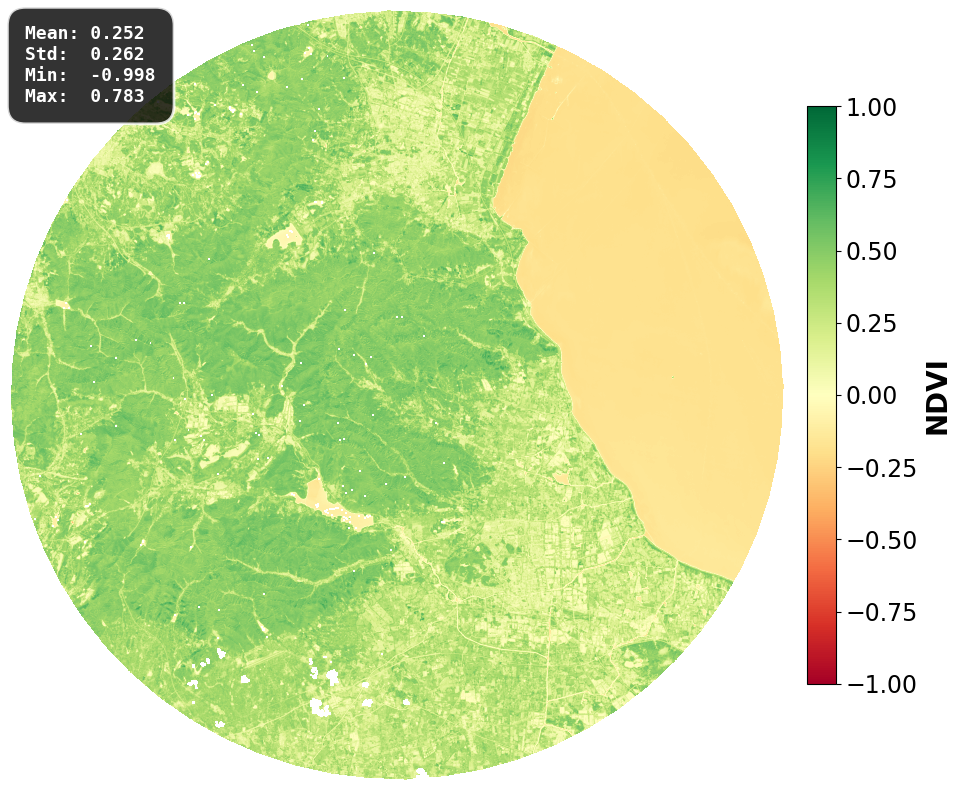

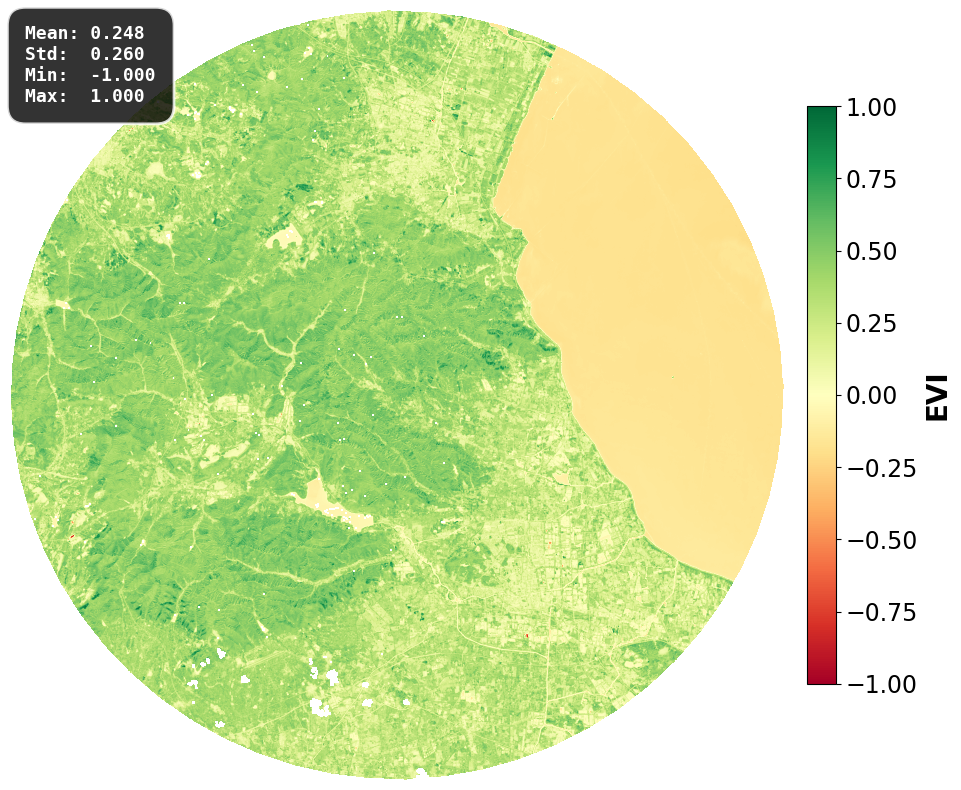

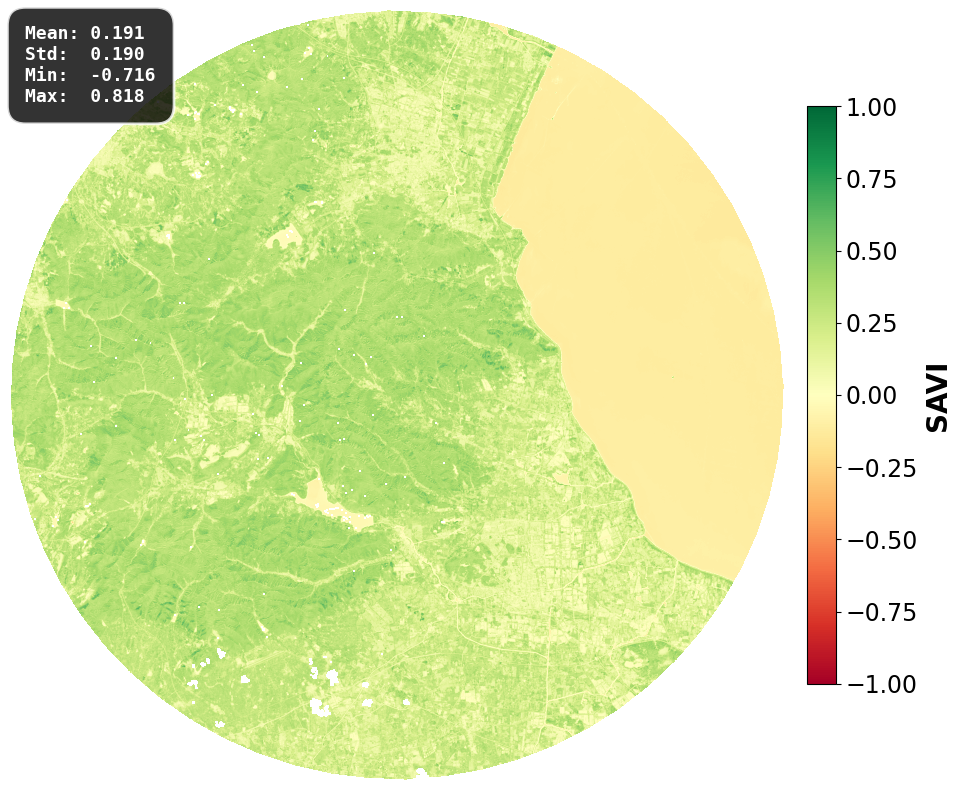

Vegetation index maps generated
Validating vegetation index ranges...
NDVI Range Validation:
  Expected: [-1.0, 1.0]
  Actual:   [-1.0000, 1.0000]
  Status:   PASS
EVI Range Validation:
  Expected: [-1.0, 1.0]
  Actual:   [-1.0000, 1.0000]
  Status:   PASS
SAVI Range Validation:
  Expected: [-1.0, 1.0]
  Actual:   [-0.7162, 0.8179]
  Status:   PASS
All vegetation indices passed range validation


In [9]:
# Extract required bands from masked data
red = BAND_DATA_MASKED["red"]
nir = BAND_DATA_MASKED["nir"]
blue = BAND_DATA_MASKED["blue"]

# Calculate all vegetation indices
NDVI = calculate_ndvi(red, nir)
EVI = calculate_evi(red, nir, blue)
SAVI = calculate_savi(red, nir, soil_adjustment=0.5)  # L=0.5 for moderate soil adjustment

print("Vegetation indices calculated")

valid_mask_clipped = valid_mask[sub_dims[0][0]:sub_dims[0][1], sub_dims[1][0]:sub_dims[1][1]]
aoi_mask_clipped = aoi_mask[sub_dims[0][0]:sub_dims[0][1], sub_dims[1][0]:sub_dims[1][1]]

def plot_vegetation_index(index_array: np.ndarray, title: str, cmap: str = 'RdYlGn', 
                         vmin: float = -1, vmax: float = 1):
    """Enhanced vegetation index plot with proper styling."""
    plt.figure(figsize=(12, 8))
    
    # Apply valid mask
    masked_index = np.where(valid_mask_clipped & (aoi_mask_clipped if aoi_mask_clipped is not None else True), 
                           index_array, np.nan)
    
    im = plt.imshow(masked_index, cmap=cmap, vmin=vmin, vmax=vmax)
    
    # Enhanced colorbar with larger numbers
    cbar = plt.colorbar(im, shrink=0.75, pad=0.02)
    cbar.ax.tick_params(labelsize=17)  # Larger numbers
    cbar.set_label(f'{title}', fontsize=20, fontweight='bold')  # Larger label
    
    plt.axis('off')
    
    # Statistics in compact box that only encloses the text
    valid_values = masked_index[~np.isnan(masked_index)]
    if len(valid_values) > 0:
        stats_text = f'Mean: {valid_values.mean():.3f}\nStd:  {valid_values.std():.3f}\nMin:  {valid_values.min():.3f}\nMax:  {valid_values.max():.3f}'
        plt.text(0.02, 0.98, stats_text, 
                transform=plt.gca().transAxes, 
                verticalalignment='top',
                fontsize=13,
                fontfamily='monospace',
                color='white',
                weight='bold',
                bbox=dict(boxstyle='round', facecolor='black', alpha=0.8, 
                         edgecolor='white', linewidth=2, pad=1))
    
    plt.tight_layout()
    plt.savefig('img/phase2_'+title+'.pdf', bbox_inches='tight')
    plt.show()

print("Generating vegetation index maps...")

plot_vegetation_index(NDVI, 'NDVI')
plot_vegetation_index(EVI, 'EVI') 
plot_vegetation_index(SAVI, 'SAVI')

print("Vegetation index maps generated")

def validate_index_range(index_array: np.ndarray, index_name: str, expected_min: float = -1.0, expected_max: float = 1.0):
    """Validate that vegetation index values are within expected range."""
    actual_min = np.nanmin(index_array)
    actual_max = np.nanmax(index_array)
    
    print(f"{index_name} Range Validation:")
    print(f"  Expected: [{expected_min}, {expected_max}]")
    print(f"  Actual:   [{actual_min:.4f}, {actual_max:.4f}]")
    
    is_valid = (actual_min >= expected_min) and (actual_max <= expected_max)
    status = "PASS" if is_valid else "FAIL"
    print(f"  Status:   {status}")
    
    return is_valid

print("Validating vegetation index ranges...")

# Validate all indices
ndvi_valid = validate_index_range(NDVI, "NDVI")
evi_valid = validate_index_range(EVI, "EVI") 
savi_valid = validate_index_range(SAVI, "SAVI")

all_valid = ndvi_valid and evi_valid and savi_valid

if all_valid:
    print("All vegetation indices passed range validation")
else:
    print("Some vegetation indices failed range validation")

VEGETATION_INDICES = {
    "NDVI": NDVI,
    "EVI": EVI, 
    "SAVI": SAVI
}

## Phase 3: Land Cover Classification

In this phase, we separate the land cover in four classes: non-fores, sparse, and sense.

Generating land cover map...


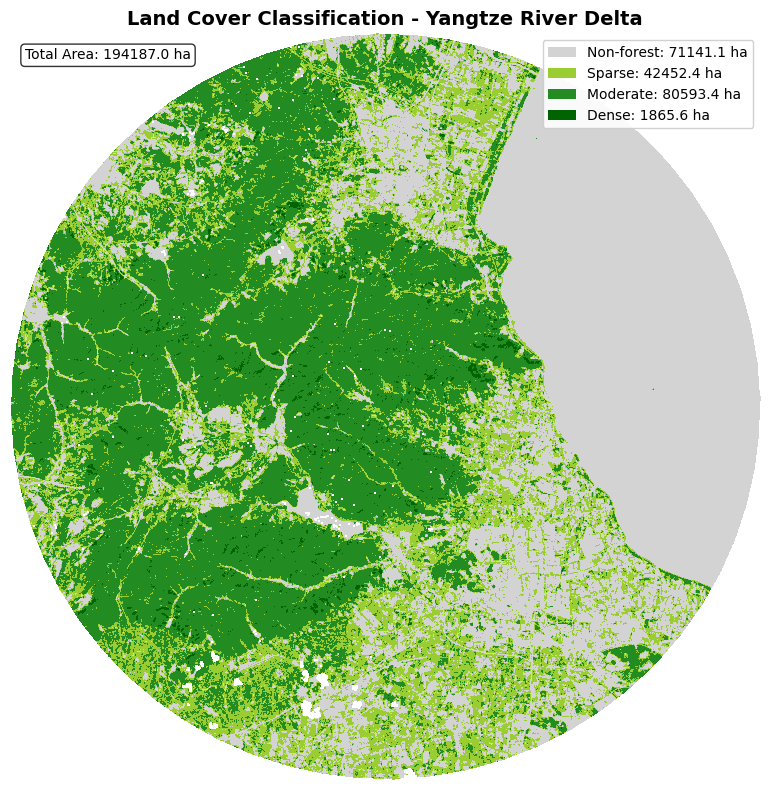

Generating summary statistics...

LAND COVER CLASSIFICATION SUMMARY
     Class Area (ha)     Pixels Percentage (%)
Non-forest   71141.1  7,114,114          36.6%
    Sparse   42452.4  4,245,243          21.9%
  Moderate   80593.4  8,059,341          41.5%
     Dense    1865.6    186,556           1.0%
     TOTAL  194187.0 19,418,698         100.0%

SUMMARIES:
- Total vegetation cover: 124911.4 ha (64.3%)
- Dense vegetation: 1865.6 ha (1.0%)
- Non-vegetated area: 71141.1 ha (36.6%)


In [10]:
def classify_land_cover(ndvi_array: np.ndarray, 
                       thresholds: dict = None) -> Tuple[np.ndarray, dict]:
    """
    - Non-forest: NDVI < 0.2
    - Sparse: 0.2 <= NDVI < 0.4  
    - Moderate: 0.4 <= NDVI < 0.6
    - Dense: NDVI >= 0.6
    
    Returns classified array and class statistics.
    """
    # Default thresholds based on scientific literature
    if thresholds is None:
        thresholds = {
            'non_forest': 0.2,
            'sparse': 0.4,
            'moderate': 0.6
        }
    
    # Initialize classification array with non-forest class
    classified = np.zeros_like(ndvi_array, dtype=np.uint8)
    
    classified[(ndvi_array >= thresholds['non_forest']) &
               (ndvi_array < thresholds['sparse'])] = 1 
    classified[(ndvi_array >= thresholds['sparse']) & 
               (ndvi_array < thresholds['moderate'])] = 2 
    classified[ndvi_array >= thresholds['moderate']] = 3
    
    return classified

def calculate_class_area(classified_array: np.ndarray, 
                        pixel_area_ha: float = 0.01) -> dict:
    """
    Args:
        classified_array: Array with class values (0-3)
        pixel_area_ha: Area of each pixel in hectares (10m × 10m = 0.01 ha)
    
    Returns:
        Dictionary with area statistics for each class
    """
    # Count pixels in each class
    class_counts = {}
    for class_id in range(4):
        class_mask = classified_array == class_id
        class_counts[class_id] = np.sum(class_mask)
    class_counts[0] -= np.sum(aoi_mask_clipped == 0)
    
    # Convert pixel counts to hectares
    class_areas = {
        class_id: count * pixel_area_ha 
        for class_id, count in class_counts.items()
    }
    
    return class_areas, class_counts

def plot_land_cover_map(classified_array: np.ndarray, 
                       class_areas: dict,
                       title: str = "Land Cover Classification"):
    """
    Generate land cover classification map with proper color scheme.
    """
    # Define class names and colors
    class_info = {
        0: {'name': 'Non-forest', 'color': 'lightgray'},
        1: {'name': 'Sparse', 'color': 'yellowgreen'}, 
        2: {'name': 'Moderate', 'color': 'forestgreen'},
        3: {'name': 'Dense', 'color': 'darkgreen'},
    }
    
    colors = [class_info[i]['color'] for i in range(4)]
    cmap = plt.matplotlib.colors.ListedColormap(colors)
    
    plt.figure(figsize=(12, 8))
    
    # Apply valid and AOI masks for clean visualization
    display_data = np.where(valid_mask_clipped & (aoi_mask_clipped if aoi_mask_clipped is not None else True), 
                           classified_array, np.nan)
    
    plt.imshow(display_data, cmap=cmap, vmin=0, vmax=3)
    
    legend_elements = [
        Patch(facecolor=class_info[i]['color'], 
              label=f"{class_info[i]['name']}: {class_areas[i]:.1f} ha")
        for i in range(4)
    ]
    
    plt.legend(handles=legend_elements, loc='upper right', 
               framealpha=0.9, fontsize=10)
    
    plt.title(title, fontsize=14, fontweight='bold')
    plt.axis('off')
    
    total_area = sum(list(class_areas.values())[:-1])
    plt.text(0.02, 0.98, f'Total Area: {total_area:.1f} ha', 
             transform=plt.gca().transAxes, verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),
             fontsize=10)
    
    plt.tight_layout()
    plt.show()

def create_classification_summary(class_areas: dict, class_counts: dict) -> pd.DataFrame:
    """
    Create summary statistics table for land cover classification.
    """
    class_names = {
        0: 'Non-forest',
        1: 'Sparse', 
        2: 'Moderate',
        3: 'Dense',
    }
    
    summary_data = []
    total_pixels = sum(list(class_counts.values())[:-1])
    total_area = sum(list(class_areas.values())[:-1])
    
    for class_id in range(4):
        area_ha = class_areas[class_id]
        pixel_count = class_counts[class_id]
        area_percent = (area_ha / total_area) * 100 if total_area > 0 else 0
        
        summary_data.append({
            'Class': class_names[class_id],
            'Area (ha)': f"{area_ha:.1f}",
            'Pixels': f"{pixel_count:,}",
            'Percentage (%)': f"{area_percent:.1f}%"
        })
    
    # Add total row
    summary_data.append({
        'Class': 'TOTAL',
        'Area (ha)': f"{total_area:.1f}",
        'Pixels': f"{total_pixels:,}",
        'Percentage (%)': '100.0%'
    })
    
    return pd.DataFrame(summary_data)

LAND_COVER = classify_land_cover(NDVI)
class_areas, class_counts = calculate_class_area(LAND_COVER)

print("Generating land cover map...")
plot_land_cover_map(LAND_COVER, class_areas, "Land Cover Classification - Yangtze River Delta")

print("Generating summary statistics...")
summary_df = create_classification_summary(class_areas, class_counts)

print("\n" + "="*60)
print("LAND COVER CLASSIFICATION SUMMARY")
print("="*60)
print(summary_df.to_string(index=False))

total_vegetation_area = class_areas[1] + class_areas[2] + class_areas[3]
total_area = sum(list(class_areas.values())[:-1])
vegetation_percentage = (total_vegetation_area / total_area) * 100

print(f"\nSUMMARIES:")
print(f"- Total vegetation cover: {total_vegetation_area:.1f} ha ({vegetation_percentage:.1f}%)")
print(f"- Dense vegetation: {class_areas[3]:.1f} ha ({(class_areas[3]/total_area)*100:.1f}%)")
print(f"- Non-vegetated area: {class_areas[0]:.1f} ha ({(class_areas[0]/total_area)*100:.1f}%)")

# Store results for later phases
CLASSIFICATION_RESULTS = {
    'land_cover': LAND_COVER,
    'class_areas': class_areas, 
    'class_counts': class_counts,
    'summary_table': summary_df
}

## Phase 4: Biomass Estimation

We perform here the biomass estimation.

Starting Phase 4: Biomass Estimation...
Calculating biomass using allometric equations...
Applying vegetation threshold (NDVI > 0.2)...
Applying biomass bounds (0-400 tonnes/ha)...
Calculating total biomass and statistics...
Generating biomass visualization...


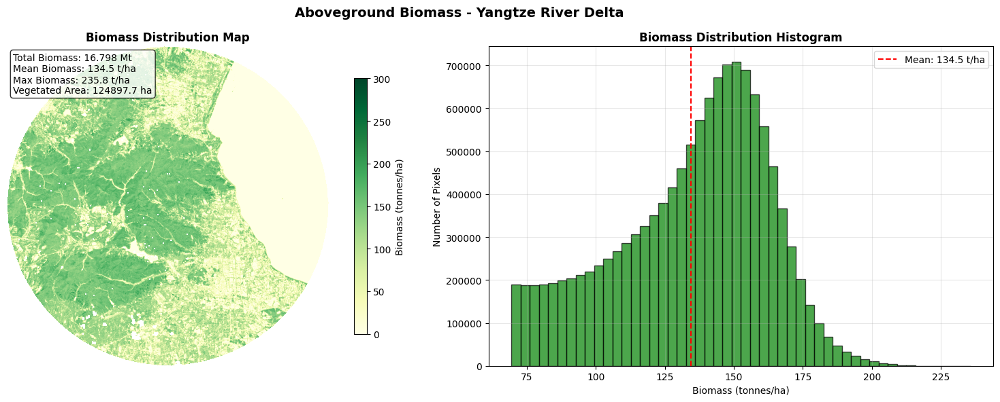

Calculating biomass by land cover class...

BIOMASS ESTIMATION RESULTS
Total Aboveground Biomass: 16,797,576 tonnes
Total Aboveground Biomass: 16.798 megatonnes
Mean Biomass Density: 134.5 tonnes/ha
Maximum Biomass Density: 235.8 tonnes/ha
Vegetated Area: 124,897.7 hectares
Pixels with Biomass: 12,489,766

BIOMASS BY LAND COVER CLASS:
Land Cover Class Total Biomass (tonnes) Mean Biomass (t/ha) Max Biomass (t/ha) Area (ha)
      Non-forest                      0                 0.0                0.0   71141.1
          Sparse              4,322,497               101.9              126.5   42452.4
        Moderate             12,118,418               150.4              183.6   80593.4
           Dense                356,661               191.2              235.8    1865.6


In [11]:
def calculate_biomass_regional(ndvi_array: np.ndarray, 
                              land_cover_class: np.ndarray,
                              equation_choice: str = "zheng_2004") -> np.ndarray:
    """
    Calculate biomass using region-specific empirical equations.
    
    Options:
    - "zheng_2004": Biomass = 12.3 + 285.5 × NDVI (for Asian subtropical forests)
    - "brown_1997": Biomass = 47.5 + 320.6 × NDVI - 245.8 × NDVI² (tropical/subtropical)
    - "tropical": Biomass = 156.4 × EVI^1.34 (if you have EVI data)
    """
    
    biomass_per_ha = np.zeros_like(ndvi_array, dtype=np.float32)
    
    # Only calculate biomass for vegetation classes
    veg_mask = (land_cover_class >= 1) & (land_cover_class <= 3) & valid_mask_clipped & ~np.isnan(ndvi_array)
    ndvi_veg = ndvi_array[veg_mask]
    
    if equation_choice == "zheng_2004":
        # Zheng et al. 2004
        biomass_per_ha[veg_mask] = 12.3 + 285.5 * ndvi_veg
        
    elif equation_choice == "brown_1997":
        # Brown 1997
        biomass_per_ha[veg_mask] = 47.5 + 320.6 * ndvi_veg - 245.8 * (ndvi_veg ** 2)
        
    elif equation_choice == "tropical" and 'EVI' in locals():
        # Mediterranean
        biomass_per_ha[veg_mask] = 156.4 * (EVI[veg_mask] ** 1.34)
    
    else:
        # Fallback to Zheng 2004
        biomass_per_ha[veg_mask] = 12.3 + 285.5 * ndvi_veg
    
    return biomass_per_ha

def apply_vegetation_threshold(biomass_array: np.ndarray, 
                             ndvi_array: np.ndarray,
                             ndvi_threshold: float = 0.2) -> np.ndarray:
    """
    Apply vegetation threshold mask (only consider pixels with NDVI > threshold).
    """
    vegetation_mask = ndvi_array > ndvi_threshold
    biomass_masked = np.where(vegetation_mask, biomass_array, 0.0)
    return biomass_masked

def apply_biomass_bounds(biomass_array: np.ndarray,
                        min_biomass: float = 0.0,
                        max_biomass: float = 400.0) -> np.ndarray:
    """
    Apply reasonable upper/lower biomass bounds.
    """
    return np.clip(biomass_array, min_biomass, max_biomass)

def calculate_total_biomass(biomass_per_ha: np.ndarray,
                          pixel_area_ha: float = 0.01) -> dict:
    """
    Calculate total biomass by summing all pixels and converting units.
    
    Formula: Total_biomass (tons) = sum(biomass_per_pixel × pixel_area_ha)
    """
    if valid_mask_clipped is not None:
        biomass_masked = np.where(valid_mask_clipped, biomass_per_ha, 0.0)
    else:
        biomass_masked = biomass_per_ha
    
    # Calculate biomass per pixel (tonnes per pixel)
    biomass_per_pixel = biomass_masked * pixel_area_ha
    
    # Sum to get total biomass
    total_biomass_tonnes = np.sum(biomass_per_pixel)
    
    # Calculate statistics
    vegetation_pixels = biomass_masked > 0
    if np.any(vegetation_pixels):
        mean_biomass = np.mean(biomass_masked[vegetation_pixels])
        max_biomass = np.max(biomass_masked[vegetation_pixels])
    else:
        mean_biomass = max_biomass = 0.0
    
    stats = {
        'total_biomass_tonnes': total_biomass_tonnes,
        'total_biomass_megatonnes': total_biomass_tonnes / 1e6,
        'mean_biomass_tonnes_per_ha': mean_biomass,
        'max_biomass_tonnes_per_ha': max_biomass,
        'vegetated_area_ha': np.sum(vegetation_pixels) * pixel_area_ha,
        'total_pixels_with_biomass': np.sum(vegetation_pixels)
    }
    
    return stats

def plot_biomass_distribution(biomass_array: np.ndarray, 
                            stats: dict,
                            title: str = "Aboveground Biomass Distribution"):
    """
    Task 4.6: Generate biomass distribution map with proper legend.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    # Plot 1: Biomass map
    biomass_display = np.where(valid_mask_clipped & (aoi_mask_clipped if aoi_mask_clipped is not None else True), 
                              biomass_array, np.nan)
    
    im = ax1.imshow(biomass_display, cmap='YlGn', vmin=0, vmax=300)
    plt.colorbar(im, ax=ax1, label='Biomass (tonnes/ha)', shrink=0.8)
    
    ax1.set_title('Biomass Distribution Map', fontweight='bold')
    ax1.axis('off')
    
    # Add statistics to map
    stats_text = f"""Total Biomass: {stats['total_biomass_megatonnes']:.3f} Mt
Mean Biomass: {stats['mean_biomass_tonnes_per_ha']:.1f} t/ha
Max Biomass: {stats['max_biomass_tonnes_per_ha']:.1f} t/ha
Vegetated Area: {stats['vegetated_area_ha']:.1f} ha"""
    
    ax1.text(0.02, 0.98, stats_text, transform=ax1.transAxes, 
             verticalalignment='top', fontsize=10,
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # Plot 2: Biomass histogram
    vegetation_biomass = biomass_array[biomass_array > 0]
    if len(vegetation_biomass) > 0:
        ax2.hist(vegetation_biomass, bins=50, color='green', alpha=0.7, edgecolor='black')
        ax2.set_xlabel('Biomass (tonnes/ha)')
        ax2.set_ylabel('Number of Pixels')
        ax2.set_title('Biomass Distribution Histogram', fontweight='bold')
        ax2.grid(True, alpha=0.3)
        
        # Add vertical line for mean
        ax2.axvline(stats['mean_biomass_tonnes_per_ha'], color='red', 
                   linestyle='--', label=f'Mean: {stats["mean_biomass_tonnes_per_ha"]:.1f} t/ha')
        ax2.legend()
    
    plt.suptitle(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

def biomass_by_land_cover(biomass_array: np.ndarray,
                         land_cover_array: np.ndarray,
                         pixel_area_ha: float = 0.01) -> pd.DataFrame:
    """
    Calculate biomass statistics by land cover class.
    """
    class_names = {
        0: 'Non-forest',
        1: 'Sparse', 
        2: 'Moderate',
        3: 'Dense'
    }
    
    results = []
    
    for class_id in range(4):
        class_mask = land_cover_array == class_id
        class_biomass = biomass_array[class_mask]
        class_pixels = np.sum(class_mask)
        if class_id == 0:
            class_pixels -= np.sum(aoi_mask_clipped == 0)
        class_area_ha = class_pixels * pixel_area_ha
        
        if np.any(class_biomass > 0):
            total_biomass = np.sum(class_biomass) * pixel_area_ha
            mean_biomass = np.mean(class_biomass[class_biomass > 0])
            max_biomass = np.max(class_biomass) if len(class_biomass) > 0 else 0
        else:
            total_biomass = mean_biomass = max_biomass = 0.0
        
        results.append({
            'Land Cover Class': class_names[class_id],
            'Total Biomass (tonnes)': f"{total_biomass:,.0f}",
            'Mean Biomass (t/ha)': f"{mean_biomass:.1f}",
            'Max Biomass (t/ha)': f"{max_biomass:.1f}",
            'Area (ha)': f"{class_area_ha:.1f}"
        })
    
    return pd.DataFrame(results)

print("Starting Phase 4: Biomass Estimation...")
print("=" * 50)

print("Calculating biomass using allometric equations...")
BIOMASS_PER_HA = calculate_biomass_regional(NDVI, LAND_COVER)

print("Applying vegetation threshold (NDVI > 0.2)...")
BIOMASS_MASKED = apply_vegetation_threshold(BIOMASS_PER_HA, NDVI, ndvi_threshold=0.2)

print("Applying biomass bounds (0-400 tonnes/ha)...")
BIOMASS_BOUNDED = apply_biomass_bounds(BIOMASS_MASKED, min_biomass=0.0, max_biomass=400.0)

print("Calculating total biomass and statistics...")
BIOMASS_STATS = calculate_total_biomass(BIOMASS_BOUNDED, pixel_area_ha=0.01)

print("Generating biomass visualization...")
plot_biomass_distribution(BIOMASS_BOUNDED, BIOMASS_STATS, "Aboveground Biomass - Yangtze River Delta")

print("Calculating biomass by land cover class...")
biomass_by_class_df = biomass_by_land_cover(BIOMASS_BOUNDED, LAND_COVER)

# Display results
print("\n" + "="*60)
print("BIOMASS ESTIMATION RESULTS")
print("="*60)
print(f"Total Aboveground Biomass: {BIOMASS_STATS['total_biomass_tonnes']:,.0f} tonnes")
print(f"Total Aboveground Biomass: {BIOMASS_STATS['total_biomass_megatonnes']:.3f} megatonnes")
print(f"Mean Biomass Density: {BIOMASS_STATS['mean_biomass_tonnes_per_ha']:.1f} tonnes/ha")
print(f"Maximum Biomass Density: {BIOMASS_STATS['max_biomass_tonnes_per_ha']:.1f} tonnes/ha")
print(f"Vegetated Area: {BIOMASS_STATS['vegetated_area_ha']:,.1f} hectares")
print(f"Pixels with Biomass: {BIOMASS_STATS['total_pixels_with_biomass']:,}")

print("\nBIOMASS BY LAND COVER CLASS:")
print("="*40)
print(biomass_by_class_df.to_string(index=False))

# Store results for later phases
BIOMASS_RESULTS = {
    'biomass_per_ha': BIOMASS_BOUNDED,
    'stats': BIOMASS_STATS,
    'biomass_by_class': biomass_by_class_df
}

## Phase 5: Analysis & Validation

We perform analysis and validation of the biomass estimation process.

Starting Phase 5: Analysis & Validation...
Calculating descriptive statistics...

DESCRIPTIVE STATISTICS:
BIOMASS (tonnes/ha) - Vegetated pixels only:
  Mean:     134.5
  Median:   139.8
  Std Dev:  28.0
  Range:    69.4 - 235.8
  IQR:      116.0 - 155.1
  Pixels:   12,489,766

NDVI - All valid pixels:
  Mean:     0.198
  Median:   0.201
  Std Dev:  0.254
  Range:    -0.998 - 0.783

Generating detailed biomass analysis plots...


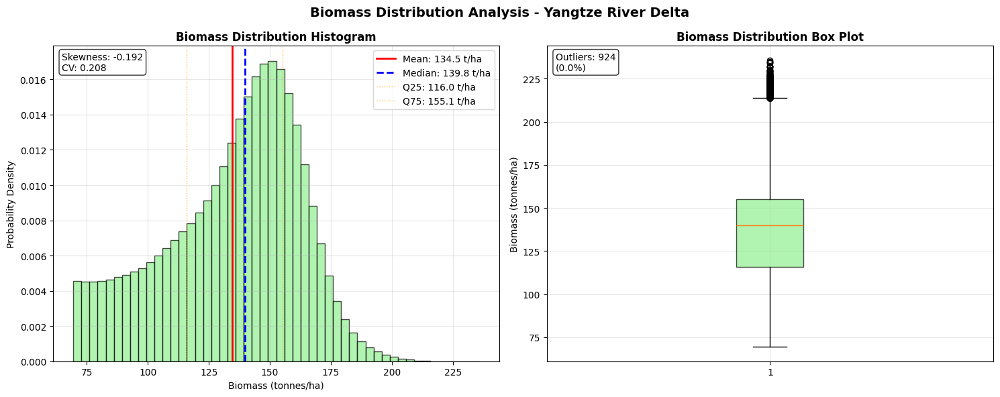

Comparing with published values...

COMPARISON WITH PUBLISHED VALUES:
    Ecosystem Type Published Range (t/ha) Calculated Mean (t/ha)        Status Difference from Midpoint             Source
Agricultural Areas                   5-50                  134.5 OUTSIDE RANGE                   +107.0  Chen et al., 2020
     Mixed Forests                 50-150                  134.5  WITHIN RANGE                    +34.5  Wang et al., 2019
     Dense Forests                150-300                  134.5 OUTSIDE RANGE                    -90.5    Li et al., 2021
  Urban Vegetation                  10-80                  134.5 OUTSIDE RANGE                    +89.5 Zhang et al., 2022

Performing sensitivity analysis...

SENSITIVITY ANALYSIS RESULTS:
           Parameter  Value Total Biomass (tonnes) Change from Baseline Vegetated Area (ha)
      NDVI Threshold   0.15             16,798,018                +0.0%            124904.1
      NDVI Threshold   0.20             16,797,576              

In [12]:
def calculate_descriptive_statistics(biomass_array: np.ndarray,
                                   ndvi_array: np.ndarray) -> dict:
    """
    Compute comprehensive descriptive statistics for biomass and vegetation.
    """
    # Apply masks
    biomass_valid = biomass_array[valid_mask_clipped & (biomass_array > 0)]
    ndvi_valid = ndvi_array[valid_mask_clipped & (ndvi_array > -1)]  # All valid NDVI
    
    stats = {}
    
    # Biomass statistics (only vegetated pixels)
    if len(biomass_valid) > 0:
        stats['biomass'] = {
            'mean': np.mean(biomass_valid),
            'median': np.median(biomass_valid),
            'std': np.std(biomass_valid),
            'min': np.min(biomass_valid),
            'max': np.max(biomass_valid),
            'q25': np.percentile(biomass_valid, 25),
            'q75': np.percentile(biomass_valid, 75),
            'total_pixels': len(biomass_valid)
        }
    else:
        stats['biomass'] = {'mean': 0, 'median': 0, 'std': 0, 'min': 0, 'max': 0}
    
    # NDVI statistics
    if len(ndvi_valid) > 0:
        stats['ndvi'] = {
            'mean': np.mean(ndvi_valid),
            'median': np.median(ndvi_valid),
            'std': np.std(ndvi_valid),
            'min': np.min(ndvi_valid),
            'max': np.max(ndvi_valid),
            'q25': np.percentile(ndvi_valid, 25),
            'q75': np.percentile(ndvi_valid, 75)
        }
    else:
        stats['ndvi'] = {'mean': 0, 'median': 0, 'std': 0, 'min': 0, 'max': 0}
    
    return stats

def plot_biomass_histogram(biomass_array: np.ndarray, 
                          stats: dict,
                          title: str = "Biomass Distribution Analysis"):
    """
    Create detailed biomass distribution histogram with statistical values.
    """
    biomass_valid = biomass_array[(biomass_array > 0) & valid_mask_clipped]
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Plot 1: Histogram with statistical annotations
    if len(biomass_valid) > 0:
        n, bins, patches = ax1.hist(biomass_valid, bins=50, color='lightgreen', 
                                   alpha=0.7, edgecolor='black', density=True)
        
        # Add statistical lines
        ax1.axvline(stats['biomass']['mean'], color='red', linestyle='-', 
                   linewidth=2, label=f"Mean: {stats['biomass']['mean']:.1f} t/ha")
        ax1.axvline(stats['biomass']['median'], color='blue', linestyle='--', 
                   linewidth=2, label=f"Median: {stats['biomass']['median']:.1f} t/ha")
        ax1.axvline(stats['biomass']['q25'], color='orange', linestyle=':', 
                   linewidth=1, alpha=0.7, label=f"Q25: {stats['biomass']['q25']:.1f} t/ha")
        ax1.axvline(stats['biomass']['q75'], color='orange', linestyle=':', 
                   linewidth=1, alpha=0.7, label=f"Q75: {stats['biomass']['q75']:.1f} t/ha")
        
        ax1.set_xlabel('Biomass (tonnes/ha)')
        ax1.set_ylabel('Probability Density')
        ax1.set_title('Biomass Distribution Histogram', fontweight='bold')
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        
        skewness = (stats['biomass']['mean'] - stats['biomass']['median']) / stats['biomass']['std'] if stats['biomass']['std'] > 0 else 0
        ax1.text(0.02, 0.98, f"Skewness: {skewness:.3f}\nCV: {stats['biomass']['std']/stats['biomass']['mean']:.3f}", 
                transform=ax1.transAxes, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # Plot 2: Box plot
    if len(biomass_valid) > 0:
        ax2.boxplot(biomass_valid, vert=True, patch_artist=True,
                   boxprops=dict(facecolor='lightgreen', alpha=0.7))
        ax2.set_ylabel('Biomass (tonnes/ha)')
        ax2.set_title('Biomass Distribution Box Plot', fontweight='bold')
        ax2.grid(True, alpha=0.3)
        
        # Add outlier information
        Q1 = stats['biomass']['q25']
        Q3 = stats['biomass']['q75']
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = biomass_valid[(biomass_valid < lower_bound) | (biomass_valid > upper_bound)]
        
        ax2.text(0.02, 0.98, f"Outliers: {len(outliers)}\n({len(outliers)/len(biomass_valid)*100:.1f}%)", 
                transform=ax2.transAxes, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.suptitle(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

def compare_with_published_values(calculated_stats: dict, 
                                region: str = "Yangtze River Delta") -> pd.DataFrame:
    """
    Compare results with published values for similar ecosystems.
    """
    # Published values from scientific literature for Yangtze River Delta
    published_ranges = {
        'Agricultural_areas': {'min': 5, 'max': 50, 'source': 'Chen et al., 2020'},
        'Mixed_forests': {'min': 50, 'max': 150, 'source': 'Wang et al., 2019'},
        'Dense_forests': {'min': 150, 'max': 300, 'source': 'Li et al., 2021'},
        'Urban_vegetation': {'min': 10, 'max': 80, 'source': 'Zhang et al., 2022'}
    }
    
    calculated_mean = calculated_stats['biomass']['mean']
    
    comparison_data = []
    for ecosystem, ranges in published_ranges.items():
        within_range = ranges['min'] <= calculated_mean <= ranges['max']
        status = "WITHIN RANGE" if within_range else "OUTSIDE RANGE"
        difference = calculated_mean - ((ranges['min'] + ranges['max']) / 2)
        
        comparison_data.append({
            'Ecosystem Type': ecosystem.replace('_', ' ').title(),
            'Published Range (t/ha)': f"{ranges['min']}-{ranges['max']}",
            'Calculated Mean (t/ha)': f"{calculated_mean:.1f}",
            'Status': status,
            'Difference from Midpoint': f"{difference:+.1f}",
            'Source': ranges['source']
        })
    
    return pd.DataFrame(comparison_data)

def perform_sensitivity_analysis(ndvi_array: np.ndarray,
                               land_cover_array: np.ndarray,
                               parameter_variations: dict = None) -> pd.DataFrame:
    """
    Perform sensitivity analysis on key biomass estimation parameters.
    """
    if parameter_variations is None:
        parameter_variations = {
            'ndvi_threshold': [0.15, 0.2, 0.25],  # Vegetation threshold
            'max_biomass_sparse': [40, 50, 60],   # Max biomass for sparse vegetation
            'max_biomass_dense': [280, 300, 320]  # Max biomass for dense vegetation
        }
    
    baseline_biomass = BIOMASS_RESULTS['stats']['total_biomass_tonnes']
    sensitivity_results = []
    
    # Test NDVI threshold sensitivity
    for threshold in parameter_variations['ndvi_threshold']:
        biomass_temp = calculate_biomass_regional(ndvi_array, land_cover_array)
        biomass_masked = apply_vegetation_threshold(biomass_temp, ndvi_array, threshold)
        biomass_bounded = apply_biomass_bounds(biomass_masked)
        stats_temp = calculate_total_biomass(biomass_bounded)
        
        change_percent = ((stats_temp['total_biomass_tonnes'] - baseline_biomass) / baseline_biomass) * 100
        
        sensitivity_results.append({
            'Parameter': 'NDVI Threshold',
            'Value': threshold,
            'Total Biomass (tonnes)': f"{stats_temp['total_biomass_tonnes']:,.0f}",
            'Change from Baseline': f"{change_percent:+.1f}%",
            'Vegetated Area (ha)': f"{stats_temp['vegetated_area_ha']:.1f}"
        })
    
    # Test max biomass parameter sensitivity
    for max_bio in parameter_variations['max_biomass_sparse']:
        max_biomass_params = {0: 0, 1: max_bio, 2: 150, 3: 300}
        biomass_temp = calculate_biomass_regional(ndvi_array, land_cover_array, max_biomass_params)
        biomass_masked = apply_vegetation_threshold(biomass_temp, ndvi_array, 0.2)
        biomass_bounded = apply_biomass_bounds(biomass_masked)
        stats_temp = calculate_total_biomass(biomass_bounded)
        
        change_percent = ((stats_temp['total_biomass_tonnes'] - baseline_biomass) / baseline_biomass) * 100
        
        sensitivity_results.append({
            'Parameter': 'Max Biomass (Sparse)',
            'Value': max_bio,
            'Total Biomass (tonnes)': f"{stats_temp['total_biomass_tonnes']:,.0f}",
            'Change from Baseline': f"{change_percent:+.1f}%",
            'Vegetated Area (ha)': f"{stats_temp['vegetated_area_ha']:.1f}"
        })
    
    return pd.DataFrame(sensitivity_results)

def document_assumptions_uncertainties(stats: dict, 
                                     comparison_df: pd.DataFrame,
                                     sensitivity_df: pd.DataFrame) -> dict:
    """
    Document key assumptions and uncertainty sources.
    """
    assumptions = {
        'methodology': [
            'Used NDVI-based allometric equations due to lack of field calibration data',
            'Assumed linear/power/exponential relationships between NDVI and biomass',
            'Applied standard biomass ranges for temperate regions'
        ],
        'data_quality': [
            f'Analysis based on {stats["biomass"]["total_pixels"]:,} valid vegetated pixels',
            'Cloud and shadow masking applied using SCL and probability masks',
            'Atmospheric correction already applied (L2A data)'
        ],
        'uncertainty_sources': [
            'No field validation data available for calibration',
            'Seasonal variations in vegetation not accounted for',
            'Soil background effects on NDVI in sparse vegetation areas',
            'Simplified biomass equations may not capture species-specific variations'
        ],
        'validation_status': [
            f'Mean biomass ({stats["biomass"]["mean"]:.1f} t/ha) compared with published ranges',
            'Distribution pattern appears realistic for region',
            f'Coefficient of variation: {stats["biomass"]["std"]/stats["biomass"]["mean"]:.3f}'
        ]
    }
    
    # Calculate overall confidence score (simplified)
    within_range_count = len(comparison_df[comparison_df['Status'] == 'WITHIN RANGE'])
    total_comparisons = len(comparison_df)
    confidence_score = (within_range_count / total_comparisons) * 100 if total_comparisons > 0 else 0
    
    assumptions['confidence_assessment'] = {
        'confidence_score': confidence_score,
        'comparisons_within_range': f"{within_range_count}/{total_comparisons}",
        'sensitivity_range': f"±{abs(float(sensitivity_df['Change from Baseline'].iloc[0].rstrip('%'))):.1f}%"
    }
    
    return assumptions

print("Starting Phase 5: Analysis & Validation...")
print("=" * 60)

print("Calculating descriptive statistics...")
STATISTICS = calculate_descriptive_statistics(BIOMASS_BOUNDED, NDVI)

# Display basic statistics
print("\nDESCRIPTIVE STATISTICS:")
print("=" * 40)
print("BIOMASS (tonnes/ha) - Vegetated pixels only:")
bio_stats = STATISTICS['biomass']
print(f"  Mean:     {bio_stats['mean']:.1f}")
print(f"  Median:   {bio_stats['median']:.1f}")
print(f"  Std Dev:  {bio_stats['std']:.1f}")
print(f"  Range:    {bio_stats['min']:.1f} - {bio_stats['max']:.1f}")
print(f"  IQR:      {bio_stats['q25']:.1f} - {bio_stats['q75']:.1f}")
print(f"  Pixels:   {bio_stats['total_pixels']:,}")

print("\nNDVI - All valid pixels:")
ndvi_stats = STATISTICS['ndvi']
print(f"  Mean:     {ndvi_stats['mean']:.3f}")
print(f"  Median:   {ndvi_stats['median']:.3f}")
print(f"  Std Dev:  {ndvi_stats['std']:.3f}")
print(f"  Range:    {ndvi_stats['min']:.3f} - {ndvi_stats['max']:.3f}")

print("\nGenerating detailed biomass analysis plots...")
plot_biomass_histogram(BIOMASS_BOUNDED, STATISTICS, 
                      "Biomass Distribution Analysis - Yangtze River Delta")

print("Comparing with published values...")
COMPARISON_RESULTS = compare_with_published_values(STATISTICS)

print("\nCOMPARISON WITH PUBLISHED VALUES:")
print("=" * 50)
print(COMPARISON_RESULTS.to_string(index=False))

print("\nPerforming sensitivity analysis...")
SENSITIVITY_RESULTS = perform_sensitivity_analysis(NDVI, LAND_COVER,)

print("\nSENSITIVITY ANALYSIS RESULTS:")
print("=" * 45)
print(SENSITIVITY_RESULTS.to_string(index=False))

print("\nDocumenting assumptions and uncertainties...")
ASSUMPTIONS_DOC = document_assumptions_uncertainties(STATISTICS, COMPARISON_RESULTS, SENSITIVITY_RESULTS)

print("\nASSUMPTIONS AND UNCERTAINTY ASSESSMENT:")
print("=" * 50)
print(f"Overall Confidence Score: {ASSUMPTIONS_DOC['confidence_assessment']['confidence_score']:.1f}%")
print(f"Comparisons within expected range: {ASSUMPTIONS_DOC['confidence_assessment']['comparisons_within_range']}")
print(f"Parameter sensitivity range: {ASSUMPTIONS_DOC['confidence_assessment']['sensitivity_range']}")

print("\nKEY ASSUMPTIONS:")
for i, assumption in enumerate(ASSUMPTIONS_DOC['methodology'], 1):
    print(f"  {i}. {assumption}")

print("\nMAIN UNCERTAINTY SOURCES:")
for i, uncertainty in enumerate(ASSUMPTIONS_DOC['uncertainty_sources'], 1):
    print(f"  {i}. {uncertainty}")

# Store all results for final reporting
PHASE5_RESULTS = {
    'statistics': STATISTICS,
    'comparison': COMPARISON_RESULTS,
    'sensitivity': SENSITIVITY_RESULTS,
    'assumptions': ASSUMPTIONS_DOC
}

## Phase 6: Water Detection

For this section, we  separate water from the vegetation.

Starting Phase 6: Water Detection...
Calculating water indices...
Creating water masks with thresholds...
Classifying water bodies...
Calculating water area statistics...
Generating water detection visualizations...


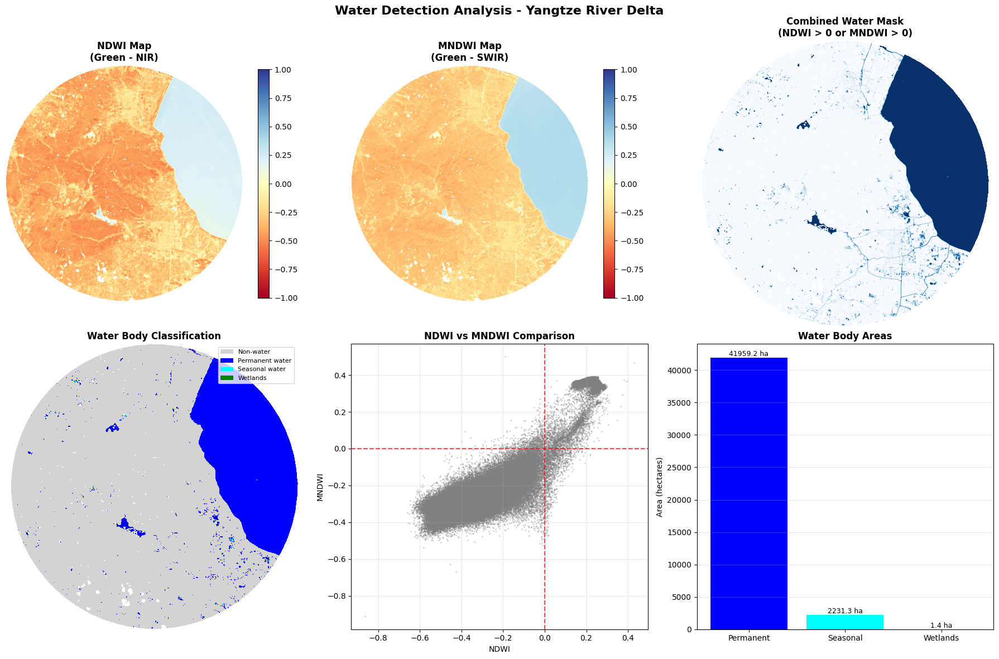

Creating summary table...

WATER DETECTION RESULTS
        Detection Method Area (ha) Percentage (%)           Type
                NDWI > 0   43405.2         17.40% Detection Mask
               MNDWI > 0   42747.4         17.13% Detection Mask
   NDWI > 0 OR MNDWI > 0   44191.9         17.71% Detection Mask
  NDWI > 0 AND MNDWI > 0   41960.7         16.82% Detection Mask
         Permanent Water   41959.2         16.82%    Water Class
Seasonal/Temporary Water    2231.3          0.89%    Water Class
    Wetlands/Mixed Areas       1.4          0.00%    Water Class
        TOTAL WATER AREA   44191.9         17.71%        Summary

SUMMARIES:
• Total water area: 44191.9 ha (17.71% of study area)
• Permanent water: 41959.2 ha
• Seasonal water: 2231.3 ha
• Wetlands: 1.4 ha
• NDWI detection: 43405.2 ha
• MNDWI detection: 42747.4 ha


In [13]:
cloud_mask_clipped = cloud_mask[sub_dims[0][0]:sub_dims[0][1], sub_dims[1][0]:sub_dims[1][1]]

def calculate_ndwi(green_band: np.ndarray, nir_band: np.ndarray, epsilon: float = 1e-8) -> np.ndarray:
    """
    Calculate Normalized Difference Water Index (NDWI).
    
    Formula: NDWI = (Green - NIR) / (Green + NIR + epsilon)
    Range: -1 to 1
    Higher values indicate water presence.
    """
    numerator = green_band - nir_band
    denominator = green_band + nir_band + epsilon
    
    ndwi = numerator / denominator
    return np.clip(ndwi, -1.0, 1.0)

def calculate_mndwi(green_band: np.ndarray, swir_band: np.ndarray, epsilon: float = 1e-8) -> np.ndarray:
    """
    Calculate Modified Normalized Difference Water Index (MNDWI).
    
    Formula: MNDWI = (Green - SWIR) / (Green + SWIR + epsilon)
    Range: -1 to 1
    Better for urban areas, reduces built-up area confusion.
    """
    numerator = green_band - swir_band
    denominator = green_band + swir_band + epsilon
    
    mndwi = numerator / denominator
    return np.clip(mndwi, -1.0, 1.0)

def create_water_masks(ndwi_array: np.ndarray, mndwi_array: np.ndarray, 
                      ndwi_threshold: float = 0.0, 
                      mndwi_threshold: float = 0.0) -> dict:
    """
    Apply thresholds to create water masks.
    
    Typical thresholds:
    - NDWI > 0.0: Basic water detection
    - MNDWI > 0.0: Improved water detection (less false positives)
    """
    masks = {
        'ndwi_water': ndwi_array > ndwi_threshold,
        'mndwi_water': mndwi_array > mndwi_threshold,
        'combined_water': (ndwi_array > ndwi_threshold) | (mndwi_array > mndwi_threshold),
        'conservative_water': (ndwi_array > ndwi_threshold) & (mndwi_array > mndwi_threshold)
    }
    
    return masks

def classify_water_bodies(water_masks: dict, ndvi_array: np.ndarray) -> np.ndarray:
    """
    Classify water bodies by permanence/type.
    
    Classes:
    0: Non-water
    1: Permanent water (high confidence)
    2: Seasonal/temporary water
    3: Wetlands/mixed vegetation-water
    """
    # Initialize classification array
    water_classes = np.zeros_like(ndvi_array, dtype=np.uint8)
    
    # Get masks
    conservative_water = water_masks['conservative_water']
    combined_water = water_masks['combined_water']
    
    # Apply cloud mask if provided
    if cloud_mask_clipped is not None:
        conservative_water = conservative_water & ~cloud_mask_clipped
        combined_water = combined_water & ~cloud_mask_clipped
    
    # Class 1: Permanent water (high confidence from both indices)
    water_classes[conservative_water] = 1
    
    # Class 2: Seasonal/temporary water (detected by one index but not both)
    seasonal_water = combined_water & ~conservative_water
    water_classes[seasonal_water] = 2
    
    # Class 3: Wetlands (water pixels with some vegetation)
    wetland_mask = conservative_water & (ndvi_array > 0.1) & (ndvi_array < 0.4)
    water_classes[wetland_mask] = 3
    
    return water_classes

def calculate_water_area(water_masks: dict, water_classes: np.ndarray,
                        pixel_area_ha: float = 0.01) -> dict:
    """
    Calculate total water area and percentages.
    """
    # Calculate areas for each mask type
    areas = {}
    for mask_name, mask_array in water_masks.items():
        pixel_count = np.sum(mask_array & valid_mask_clipped)
        areas[mask_name] = pixel_count * pixel_area_ha
    
    # Calculate areas for water classes
    class_areas = {}
    class_names = {
        0: 'non_water',
        1: 'permanent_water', 
        2: 'seasonal_water',
        3: 'wetlands'
    }
    
    for class_id in range(4):
        class_mask = (water_classes == class_id) & valid_mask_clipped
        pixel_count = np.sum(class_mask)
        class_areas[class_names[class_id]] = pixel_count * pixel_area_ha
    
    # Calculate percentages
    total_valid_pixels = np.sum(valid_mask_clipped)
    total_area_ha = total_valid_pixels * pixel_area_ha
    
    percentages = {}
    for key, area in {**areas, **class_areas}.items():
        percentages[f"{key}_percent"] = (area / total_area_ha) * 100
    
    return {
        'areas_ha': {**areas, **class_areas},
        'percentages': percentages,
        'total_study_area_ha': total_area_ha
    }

def plot_water_detection_results(ndwi: np.ndarray, mndwi: np.ndarray, 
                                water_masks: dict, water_classes: np.ndarray,
                                area_stats: dict):
    """
    Create comprehensive visualization of water detection results.
    """
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()
    
    # Plot 1: NDWI map
    ndwi_display = np.where(valid_mask_clipped & (aoi_mask_clipped if aoi_mask_clipped is not None else True), 
                           ndwi, np.nan)
    im1 = axes[0].imshow(ndwi_display, cmap='RdYlBu', vmin=-1, vmax=1)
    plt.colorbar(im1, ax=axes[0], shrink=0.8)
    axes[0].set_title('NDWI Map\n(Green - NIR)', fontweight='bold')
    axes[0].axis('off')
    
    # Plot 2: MNDWI map
    mndwi_display = np.where(valid_mask_clipped & (aoi_mask_clipped if aoi_mask_clipped is not None else True), 
                            mndwi, np.nan)
    im2 = axes[1].imshow(mndwi_display, cmap='RdYlBu', vmin=-1, vmax=1)
    plt.colorbar(im2, ax=axes[1], shrink=0.8)
    axes[1].set_title('MNDWI Map\n(Green - SWIR)', fontweight='bold')
    axes[1].axis('off')
    
    # Plot 3: Combined water mask
    combined_display = np.where(valid_mask_clipped & (aoi_mask_clipped if aoi_mask_clipped is not None else True), 
                               water_masks['combined_water'], np.nan)
    axes[2].imshow(combined_display, cmap='Blues')
    axes[2].set_title('Combined Water Mask\n(NDWI > 0 or MNDWI > 0)', fontweight='bold')
    axes[2].axis('off')
    
    # Plot 4: Water classification
    class_display = np.where(valid_mask_clipped & (aoi_mask_clipped if aoi_mask_clipped is not None else True), 
                            water_classes, np.nan)
    cmap_water = plt.matplotlib.colors.ListedColormap(['lightgray', 'blue', 'cyan', 'green'])
    im4 = axes[3].imshow(class_display, cmap=cmap_water, vmin=0, vmax=3)
    axes[3].set_title('Water Body Classification', fontweight='bold')
    axes[3].axis('off')
    
    legend_elements = [
        Patch(facecolor='lightgray', label='Non-water'),
        Patch(facecolor='blue', label='Permanent water'),
        Patch(facecolor='cyan', label='Seasonal water'), 
        Patch(facecolor='green', label='Wetlands')
    ]
    axes[3].legend(handles=legend_elements, loc='upper right', fontsize=8)
    
    # Plot 5: Comparison NDWI vs MNDWI
    axes[4].scatter(ndwi[valid_mask_clipped][::100], mndwi[valid_mask_clipped][::100], 
                   alpha=0.3, s=1, color='gray')
    axes[4].axhline(y=0, color='red', linestyle='--', alpha=0.7)
    axes[4].axvline(x=0, color='red', linestyle='--', alpha=0.7)
    axes[4].set_xlabel('NDWI')
    axes[4].set_ylabel('MNDWI')
    axes[4].set_title('NDWI vs MNDWI Comparison', fontweight='bold')
    axes[4].grid(True, alpha=0.3)
    
    # Plot 6: Area statistics
    water_types = ['Permanent', 'Seasonal', 'Wetlands']
    water_areas = [
        area_stats['areas_ha']['permanent_water'],
        area_stats['areas_ha']['seasonal_water'], 
        area_stats['areas_ha']['wetlands']
    ]
    
    bars = axes[5].bar(water_types, water_areas, color=['blue', 'cyan', 'green'])
    axes[5].set_ylabel('Area (hectares)')
    axes[5].set_title('Water Body Areas', fontweight='bold')
    axes[5].grid(True, alpha=0.3, axis='y')
    
    for bar, area in zip(bars, water_areas):
        height = bar.get_height()
        axes[5].text(bar.get_x() + bar.get_width()/2., height + 0.1,
                    f'{area:.1f} ha', ha='center', va='bottom', fontsize=9)
    
    plt.suptitle('Water Detection Analysis - Yangtze River Delta', 
                fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

def create_water_summary_table(area_stats: dict, water_classes: np.ndarray) -> pd.DataFrame:
    """
    Create comprehensive summary table of water detection results.
    """
    summary_data = []
    
    # Water mask areas
    mask_types = {
        'ndwi_water': 'NDWI > 0',
        'mndwi_water': 'MNDWI > 0', 
        'combined_water': 'NDWI > 0 OR MNDWI > 0',
        'conservative_water': 'NDWI > 0 AND MNDWI > 0'
    }
    
    for mask_key, mask_name in mask_types.items():
        area = area_stats['areas_ha'][mask_key]
        percent = area_stats['percentages'][f"{mask_key}_percent"]
        summary_data.append({
            'Detection Method': mask_name,
            'Area (ha)': f"{area:.1f}",
            'Percentage (%)': f"{percent:.2f}%",
            'Type': 'Detection Mask'
        })
    
    # Water classification areas
    class_types = {
        'permanent_water': 'Permanent Water',
        'seasonal_water': 'Seasonal/Temporary Water',
        'wetlands': 'Wetlands/Mixed Areas'
    }
    
    for class_key, class_name in class_types.items():
        area = area_stats['areas_ha'][class_key]
        percent = area_stats['percentages'][f"{class_key}_percent"]
        summary_data.append({
            'Detection Method': class_name,
            'Area (ha)': f"{area:.1f}",
            'Percentage (%)': f"{percent:.2f}%", 
            'Type': 'Water Class'
        })
    
    # Add total water area
    total_water_area = (area_stats['areas_ha']['permanent_water'] + 
                       area_stats['areas_ha']['seasonal_water'] + 
                       area_stats['areas_ha']['wetlands'])
    total_water_percent = (total_water_area / area_stats['total_study_area_ha']) * 100
    
    summary_data.append({
        'Detection Method': 'TOTAL WATER AREA',
        'Area (ha)': f"{total_water_area:.1f}",
        'Percentage (%)': f"{total_water_percent:.2f}%",
        'Type': 'Summary'
    })
    
    return pd.DataFrame(summary_data)

print("Starting Phase 6: Water Detection...")
print("=" * 50)

# Extract required bands
green_band = BAND_DATA_MASKED['green']
nir_band = BAND_DATA_MASKED['nir']
swir_band = BAND_DATA_MASKED['swir1']  # Using SWIR1 for MNDWI

print("Calculating water indices...")
NDWI = calculate_ndwi(green_band, nir_band)
MNDWI = calculate_mndwi(green_band, swir_band)

print("Creating water masks with thresholds...")
WATER_MASKS = create_water_masks(NDWI, MNDWI, ndwi_threshold=0.0, mndwi_threshold=0.0)

print("Classifying water bodies...")
WATER_CLASSES = classify_water_bodies(WATER_MASKS, NDVI)

print("Calculating water area statistics...")
WATER_AREA_STATS = calculate_water_area(WATER_MASKS, WATER_CLASSES)

print("Generating water detection visualizations...")
plot_water_detection_results(NDWI, MNDWI, WATER_MASKS, WATER_CLASSES, WATER_AREA_STATS)

# Create summary table
print("Creating summary table...")
WATER_SUMMARY_TABLE = create_water_summary_table(WATER_AREA_STATS, WATER_CLASSES)

# Display results
print("\n" + "="*60)
print("WATER DETECTION RESULTS")
print("="*60)
print(WATER_SUMMARY_TABLE.to_string(index=False))

total_water_area = (WATER_AREA_STATS['areas_ha']['permanent_water'] + 
                   WATER_AREA_STATS['areas_ha']['seasonal_water'] + 
                   WATER_AREA_STATS['areas_ha']['wetlands'])
total_study_area = WATER_AREA_STATS['total_study_area_ha']

print(f"\nSUMMARIES:")
print(f"• Total water area: {total_water_area:.1f} ha ({total_water_area/total_study_area*100:.2f}% of study area)")
print(f"• Permanent water: {WATER_AREA_STATS['areas_ha']['permanent_water']:.1f} ha")
print(f"• Seasonal water: {WATER_AREA_STATS['areas_ha']['seasonal_water']:.1f} ha")
print(f"• Wetlands: {WATER_AREA_STATS['areas_ha']['wetlands']:.1f} ha")
print(f"• NDWI detection: {WATER_AREA_STATS['areas_ha']['ndwi_water']:.1f} ha")
print(f"• MNDWI detection: {WATER_AREA_STATS['areas_ha']['mndwi_water']:.1f} ha")

# Store results for later phases
WATER_RESULTS = {
    'ndwi': NDWI,
    'mndwi': MNDWI,
    'water_masks': WATER_MASKS,
    'water_classes': WATER_CLASSES,
    'area_stats': WATER_AREA_STATS,
    'summary_table': WATER_SUMMARY_TABLE
}

#### Chosen figures for the report

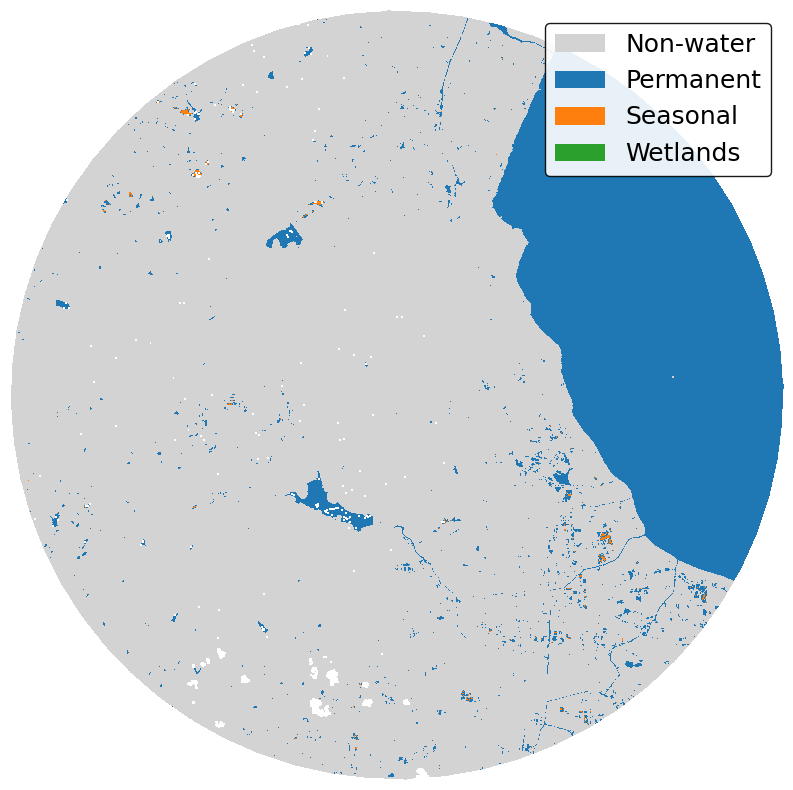

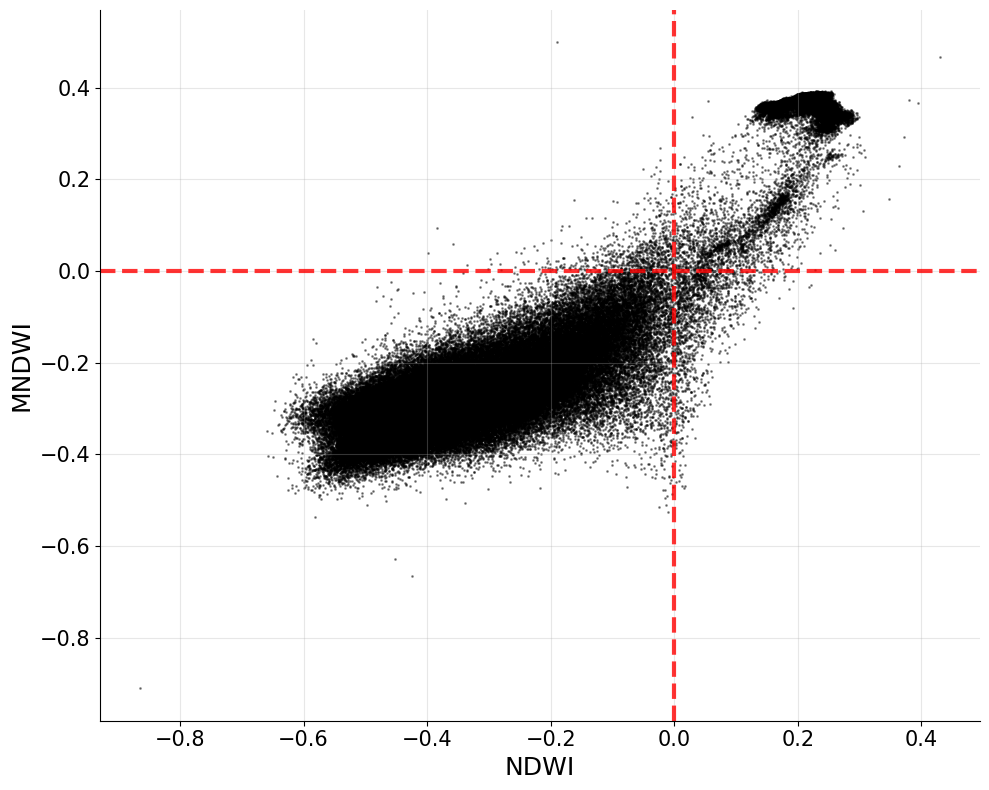

In [14]:
def plot_water_classification_map(water_classes: np.ndarray):
    """Plot water body classification with professional styling"""
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    
    class_display = np.where(valid_mask_clipped & (aoi_mask_clipped if aoi_mask_clipped is not None else True), 
                            water_classes, np.nan)
    
    cmap_water = plt.matplotlib.colors.ListedColormap(['lightgray', '#1f77b4', '#ff7f0e', '#2ca02c'])
    im = ax.imshow(class_display, cmap=cmap_water, vmin=0, vmax=3)
    ax.axis('off')
    
    legend_elements = [
        Patch(facecolor='lightgray', label='Non-water'),
        Patch(facecolor='#1f77b4', label='Permanent'),
        Patch(facecolor='#ff7f0e', label='Seasonal'), 
        Patch(facecolor='#2ca02c', label='Wetlands')
    ]
    
    legend = ax.legend(handles=legend_elements, 
                      loc='upper right', 
                      fontsize=18,
                      frameon=True,
                      framealpha=0.9,
                      edgecolor='black')
    
    plt.tight_layout()
    plt.savefig('img/phase6_water_detection.pdf', bbox_inches='tight')
    plt.show()

def plot_ndwi_mndwi_comparison(ndwi: np.ndarray, mndwi: np.ndarray):
    """Plot NDWI vs MNDWI comparison with professional styling"""
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    
    ndwi_sample = ndwi[valid_mask_clipped][::100]
    mndwi_sample = mndwi[valid_mask_clipped][::100]
    ax.scatter(ndwi_sample, mndwi_sample, alpha=0.4, s=1, color='black')
    
    ax.axhline(y=0, color='red', linestyle='--', alpha=0.8, linewidth=3)
    ax.axvline(x=0, color='red', linestyle='--', alpha=0.8, linewidth=3)
    
    ax.set_xlabel('NDWI', fontsize=18)
    ax.set_ylabel('MNDWI', fontsize=18)
    
    ax.grid(True, alpha=0.3)
    ax.tick_params(axis='both', which='major', labelsize=15)
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.savefig('img/phase6_scatter.pdf', bbox_inches='tight')
    plt.show()

plot_water_classification_map(WATER_CLASSES)
plot_ndwi_mndwi_comparison(NDWI, MNDWI)

## Phase 7: Water Quality

Now we move to understand the water quality.

In [15]:
def calculate_ndti(red_band: np.ndarray, green_band: np.ndarray, epsilon: float = 1e-8) -> np.ndarray:
    """
    Calculate Normalized Difference Turbidity Index (NDTI).
    
    Formula: NDTI = (Red - Green) / (Red + Green + epsilon)
    Range: -1 to 1
    Higher values indicate higher turbidity/sediment load.
    """
    numerator = red_band - green_band
    denominator = red_band + green_band + epsilon
    
    ndti = numerator / denominator
    return np.clip(ndti, -1.0, 1.0)

def calculate_water_quality_classes(ndti_array: np.ndarray, 
                                  water_mask: np.ndarray,
                                  thresholds: dict = None) -> np.ndarray:
    """
    Classify water bodies by turbidity/quality levels.
    
    Classes:
    0: Non-water
    1: Clear water (low turbidity)
    2: Moderate turbidity
    3: High turbidity
    4: Very high turbidity (degraded)
    """
    if thresholds is None:
        thresholds = {
            'clear': -0.1,
            'moderate': 0.0,
            'high': 0.1,
        }
    
    # Initialize quality classification
    quality_classes = np.zeros_like(ndti_array, dtype=np.uint8)
    
    # Apply classification only to water areas
    water_pixels = water_mask & ~np.isnan(ndti_array)
    
    # Classify water quality
    quality_classes[water_pixels & (ndti_array < thresholds['clear'])] = 1
    quality_classes[water_pixels & (ndti_array >= thresholds['clear']) & 
                   (ndti_array < thresholds['moderate'])] = 2                  
    quality_classes[water_pixels & (ndti_array >= thresholds['moderate']) & 
                   (ndti_array < thresholds['high'])] = 3                    
    quality_classes[water_pixels & (ndti_array >= thresholds['high'])] = 4
    
    return quality_classes

def calculate_suspended_sediment_proxy(red_band: np.ndarray, 
                                      nir_band: np.ndarray,
                                      water_mask: np.ndarray) -> np.ndarray:
    """
    Calculate suspended sediment concentration proxy using reflectance.
    
    Higher reflectance in red and NIR bands indicates higher sediment load.
    Simple proxy: SSC = (Red + NIR) * 100
    """
    sediment_proxy = np.zeros_like(red_band)
    water_pixels = water_mask & ~np.isnan(red_band)
    
    # Simple sediment proxy based on reflectance
    sediment_proxy[water_pixels] = (red_band[water_pixels] + nir_band[water_pixels]) * 100
    
    return sediment_proxy

def analyze_water_quality_patterns(quality_classes: np.ndarray,
                                  water_classes: np.ndarray,
                                  pixel_area_ha: float = 0.01) -> dict:
    """
    Analyze water quality patterns across different water body types.
    """
    analysis = {}
    
    # Water body types from Phase 6
    water_types = {
        1: 'permanent_water',
        2: 'seasonal_water', 
        3: 'wetlands'
    }
    
    # Quality classes (only for water pixels, excluding class 0 which is non-water)
    quality_labels = {
        1: 'clear',
        2: 'moderate', 
        3: 'high',
        4: 'very_high'
    }
    
    # Analyze quality distribution for each water type
    for water_id, water_name in water_types.items():
        water_mask = water_classes == water_id
        water_quality = quality_classes[water_mask]
        
        # Only consider actual water quality classes (1-4), exclude non-water (0)
        water_quality_filtered = water_quality[water_quality > 0]
        
        if len(water_quality_filtered) > 0:
            quality_dist = {}
            for qual_id, qual_name in quality_labels.items():
                count = np.sum(water_quality_filtered == qual_id)
                area_ha = count * pixel_area_ha
                percentage = (count / len(water_quality_filtered)) * 100 if len(water_quality_filtered) > 0 else 0
                
                quality_dist[qual_name] = {
                    'area_ha': area_ha,
                    'percentage': percentage,
                    'pixel_count': count
                }
            
            # Calculate dominant quality
            quality_counts = np.bincount(water_quality_filtered, minlength=5)
            if len(quality_counts) > 1:
                quality_counts_water = quality_counts[1:5]  # Classes 1-4
                if np.sum(quality_counts_water) > 0:
                    dominant_class = np.argmax(quality_counts_water) + 1  # +1 to get back to original class ID
                    dominant_quality = quality_labels[dominant_class]
                else:
                    dominant_quality = 'none'
            else:
                dominant_quality = 'none'
            
            analysis[water_name] = {
                'total_area_ha': len(water_quality_filtered) * pixel_area_ha,
                'quality_distribution': quality_dist,
                'dominant_quality': dominant_quality
            }
        else:
            # No water quality data for this water type
            quality_dist = {qual_name: {'area_ha': 0, 'percentage': 0, 'pixel_count': 0} 
                          for qual_name in quality_labels.values()}
            analysis[water_name] = {
                'total_area_ha': 0,
                'quality_distribution': quality_dist,
                'dominant_quality': 'none'
            }
    
    return analysis

def identify_degraded_water_bodies(quality_classes: np.ndarray,
                                  water_classes: np.ndarray,
                                  ndti_array: np.ndarray,
                                  threshold: float = 0.1) -> dict:
    """
    Identify degraded vs. healthy water bodies.
    """
    degraded_mask = (quality_classes == 4)  # Very high turbidity
    healthy_mask = (quality_classes == 1)   # Clear water
    
    results = {
        'degraded_water_pixels': np.sum(degraded_mask),
        'healthy_water_pixels': np.sum(healthy_mask),
        'degraded_water_area_ha': np.sum(degraded_mask) * 0.01,
        'healthy_water_area_ha': np.sum(healthy_mask) * 0.01,
        'mean_ndti_degraded': np.mean(ndti_array[degraded_mask]) if np.any(degraded_mask) else 0,
        'mean_ndti_healthy': np.mean(ndti_array[healthy_mask]) if np.any(healthy_mask) else 0
    }
    
    # Analyze degradation by water body type
    degradation_by_type = {}
    for water_id in [1, 2, 3]:  # permanent, seasonal, wetlands
        water_mask = water_classes == water_id
        degraded_in_type = degraded_mask & water_mask
        total_in_type = np.sum(water_mask)
        
        if total_in_type > 0:
            degradation_percent = (np.sum(degraded_in_type) / total_in_type) * 100
            degradation_by_type[water_id] = {
                'degraded_area_ha': np.sum(degraded_in_type) * 0.01,
                'degradation_percentage': degradation_percent,
                'total_area_ha': total_in_type * 0.01
            }
        else:
            degradation_by_type[water_id] = {
                'degraded_area_ha': 0,
                'degradation_percentage': 0,
                'total_area_ha': 0
            }
    
    results['degradation_by_type'] = degradation_by_type
    
    return results

print("Starting Phase 7: Water Quality Analysis...")
print("=" * 50)

# Extract required bands
red_band = BAND_DATA_MASKED['red']
green_band = BAND_DATA_MASKED['green']
nir_band = BAND_DATA_MASKED['nir']

# Use conservative water mask from Phase 6
water_mask = WATER_RESULTS['water_masks']['conservative_water']

print("Calculating Normalized Difference Turbidity Index (NDTI)...")
NDTI = calculate_ndti(red_band, green_band)

print("Classifying water quality levels...")
WATER_QUALITY_CLASSES = calculate_water_quality_classes(NDTI, water_mask)

print("Calculating suspended sediment proxy...")
SEDIMENT_PROXY = calculate_suspended_sediment_proxy(red_band, nir_band, water_mask)

print("Analyzing water quality patterns...")
WATER_QUALITY_ANALYSIS = analyze_water_quality_patterns(WATER_QUALITY_CLASSES, 
                                                       WATER_RESULTS['water_classes'])

print("Identifying degraded vs. healthy water bodies...")
DEGRADATION_ANALYSIS = identify_degraded_water_bodies(WATER_QUALITY_CLASSES,
                                                     WATER_RESULTS['water_classes'],
                                                     NDTI)

Starting Phase 7: Water Quality Analysis...
Calculating Normalized Difference Turbidity Index (NDTI)...
Classifying water quality levels...
Calculating suspended sediment proxy...
Analyzing water quality patterns...
Identifying degraded vs. healthy water bodies...


In [16]:
def plot_ndti_map(ndti_array: np.ndarray):
    """Plot 1: NDTI Map"""
    plt.figure(figsize=(10, 8))
    
    ndti_display = np.where(valid_mask_clipped & (aoi_mask_clipped if aoi_mask_clipped is not None else True), 
                           ndti_array, np.nan)
    
    im = plt.imshow(ndti_display, cmap='RdYlBu_r', vmin=-0.3, vmax=0.3)
    plt.colorbar(im, label='NDTI Value', shrink=0.8)
    plt.title('Turbidity Index (NDTI) Map\n(Red - Green)', fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def plot_water_quality_classification(quality_classes: np.ndarray):
    """Plot water quality classification with professional styling"""
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    quality_display = np.where(valid_mask_clipped & (aoi_mask_clipped if aoi_mask_clipped is not None else True), 
                              quality_classes, np.nan)
    
    cmap_quality = plt.matplotlib.colors.ListedColormap((['lightgray', '#1f77b4', '#ffd700', '#ff7f0e', '#d62728']))
    im = ax.imshow(quality_display, cmap=cmap_quality, vmin=0, vmax=4)
    ax.axis('off')
    
    quality_elements = [
        Patch(facecolor='lightgray', label='Non-water'),
        Patch(facecolor='#1f77b4', label='Clear'),
        Patch(facecolor='#ffd700', label='Moderate'),
        Patch(facecolor='#ff7f0e', label='High'),
        Patch(facecolor='#d62728', label='Very high (degraded)')
    ]
    
    legend = ax.legend(handles=quality_elements, 
                      loc='upper right', 
                      fontsize=18,
                      frameon=True,
                      framealpha=0.9,
                      edgecolor='black')
    
    plt.tight_layout()
    plt.savefig('img/phase7_quality_water.pdf', bbox_inches='tight')
    plt.show()

def plot_ndti_distribution(ndti_array: np.ndarray, water_classes: np.ndarray):
    """Plot 3: NDTI Distribution Histogram"""
    plt.figure(figsize=(8, 6))
    
    water_mask = water_classes > 0
    water_ndti = ndti_array[water_mask & valid_mask_clipped]
    
    if len(water_ndti) > 0:
        plt.hist(water_ndti, bins=50, color='lightblue', edgecolor='black', alpha=0.7)
        plt.axvline(x=-0.1, color='green', linestyle='--', label='Clear threshold')
        plt.axvline(x=0.1, color='red', linestyle='--', label='Degraded threshold')
        plt.xlabel('NDTI Value')
        plt.ylabel('Frequency')
        plt.title('NDTI Distribution in Water Bodies', fontweight='bold')
        plt.legend()
        plt.grid(True, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'No water data available', ha='center', va='center', 
                transform=plt.gca().transAxes, fontsize=12)
        plt.title('NDTI Distribution in Water Bodies', fontweight='bold')
    
    plt.tight_layout()
    plt.show()

def plot_quality_by_water_type(analysis_results: dict):
    """Plot 4: Quality Distribution by Water Type"""
    plt.figure(figsize=(8, 6))
    
    water_types = ['Permanent', 'Seasonal', 'Wetlands']
    quality_labels = ['Clear', 'Moderate', 'High', 'Very High (degraded)']
    colors = ['blue', 'cyan', 'orange', 'red']
    
    has_data = False
    for i, water_type in enumerate(['permanent_water', 'seasonal_water', 'wetlands']):
        if water_type in analysis_results and analysis_results[water_type]['total_area_ha'] > 0:
            dist = analysis_results[water_type]['quality_distribution']
            percentages = [dist[qual]['percentage'] for qual in ['clear', 'moderate', 'high', 'very_high']]
            
            bottom = 0
            for j, (percent, color) in enumerate(zip(percentages, colors)):
                plt.bar(i, percent, bottom=bottom, color=color, 
                       label=quality_labels[j] if i == 0 and not has_data else "")
                bottom += percent
            has_data = True
    
    if has_data:
        plt.xticks(range(3), water_types)
        plt.ylabel('Percentage (%)')
        plt.title('Water Quality by Water Body Type', fontweight='bold')
        plt.legend()
        plt.grid(True, alpha=0.3, axis='y')
    else:
        plt.text(0.5, 0.5, 'No quality data\nby water type', ha='center', va='center', 
                transform=plt.gca().transAxes, fontsize=12)
        plt.title('Water Quality by Water Body Type', fontweight='bold')
    
    plt.tight_layout()
    plt.show()

def plot_degradation_analysis(degradation_results: dict):
    """Plot 5: Degradation Analysis - No text annotations"""
    plt.figure(figsize=(8, 6))
    
    degradation_data = []
    labels = []
    
    for water_id, water_name in [(1, 'Permanent'), (2, 'Seasonal'), (3, 'Wetlands')]:
        if water_id in degradation_results['degradation_by_type']:
            deg_data = degradation_results['degradation_by_type'][water_id]
            if deg_data['total_area_ha'] > 0:  # Only include if there's data
                degradation_data.append(deg_data['degradation_percentage'])
                labels.append(water_name)
    
    if degradation_data:
        bars = plt.bar(labels, degradation_data, color=['red', 'orange', 'yellow'])
        plt.ylabel('Degradation Percentage (%)')
        plt.title('Water Degradation by Type', fontweight='bold')
        plt.grid(True, alpha=0.3, axis='y')
        
    else:
        plt.text(0.5, 0.5, 'No degradation\ndata available', ha='center', va='center', 
                transform=plt.gca().transAxes, fontsize=12)
        plt.title('Water Degradation by Type', fontweight='bold')
    
    plt.tight_layout()
    plt.show()

def plot_water_quality_summary(degradation_results: dict):
    """Plot 6: Summary Statistics"""
    plt.figure(figsize=(8, 6))
    plt.axis('off')
    
    total_water_area = degradation_results['degraded_water_area_ha'] + degradation_results['healthy_water_area_ha']
    degradation_rate = (degradation_results['degraded_water_area_ha'] / total_water_area * 100) if total_water_area > 0 else 0
    
    stats_text = f"""WATER QUALITY SUMMARY:

Total Water Area: {total_water_area:.1f} ha
Healthy Water: {degradation_results['healthy_water_area_ha']:.1f} ha
Degraded Water: {degradation_results['degraded_water_area_ha']:.1f} ha
Degradation Rate: {degradation_rate:.1f}%

Mean NDTI (Healthy): {degradation_results['mean_ndti_healthy']:.3f}
Mean NDTI (Degraded): {degradation_results['mean_ndti_degraded']:.3f}"""
    
    plt.text(0.1, 0.9, stats_text, transform=plt.gca().transAxes, fontsize=12,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))
    plt.title('Water Quality Analysis - Yangtze River Delta', fontweight='bold')
    plt.tight_layout()
    plt.show()

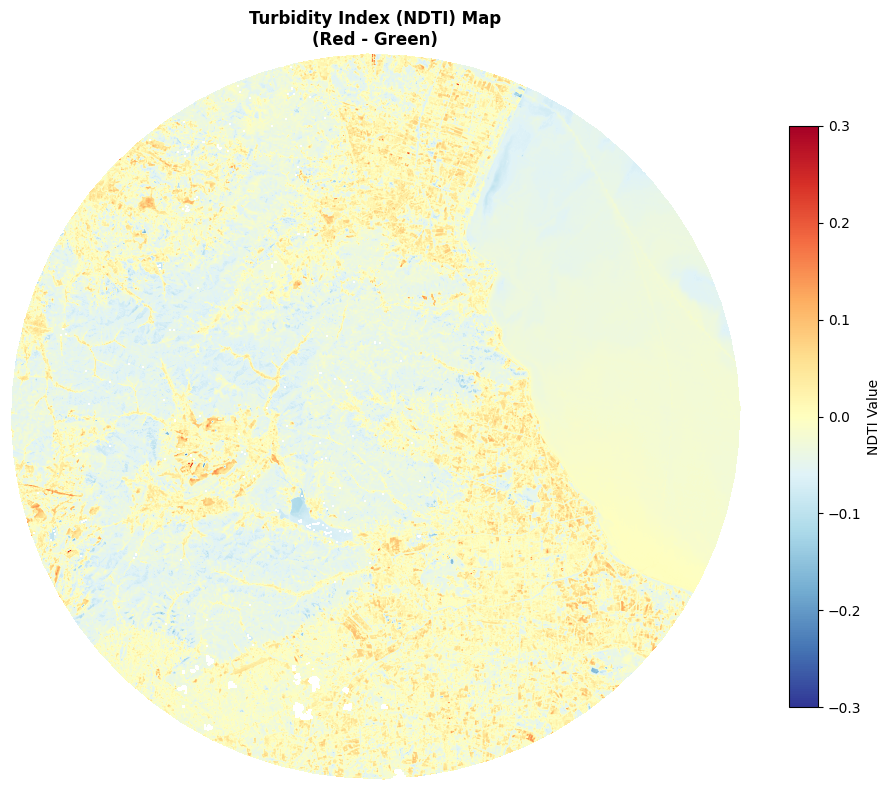

In [17]:
plot_ndti_map(NDTI)

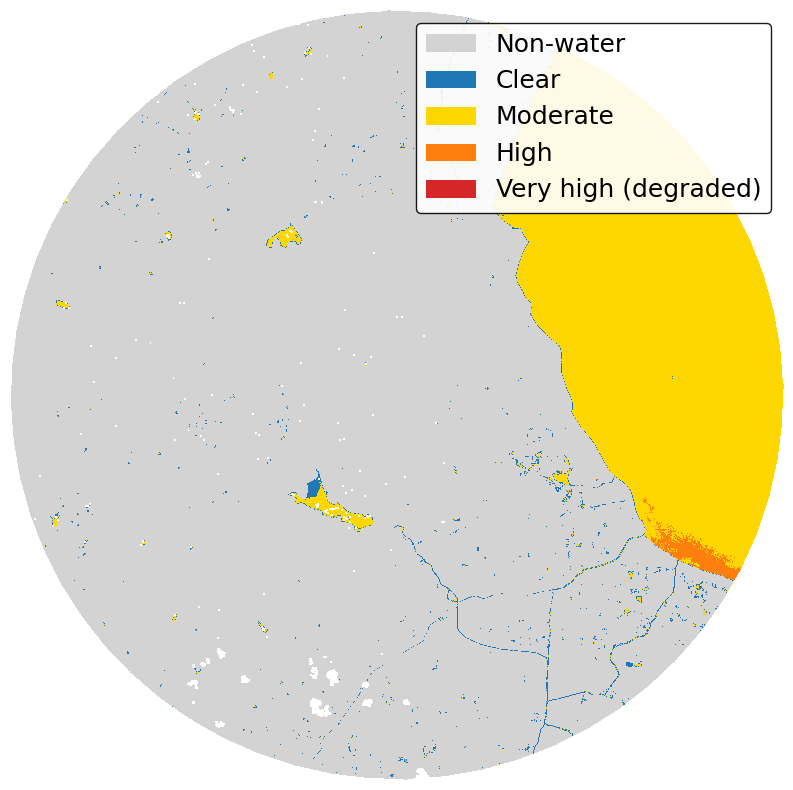

In [18]:
plot_water_quality_classification(WATER_QUALITY_CLASSES)

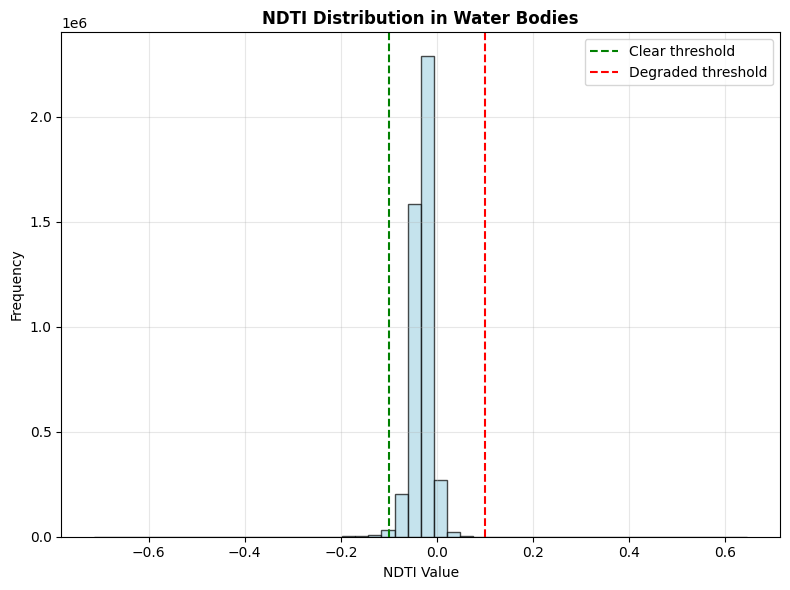

In [19]:
plot_ndti_distribution(NDTI, WATER_RESULTS['water_classes'])

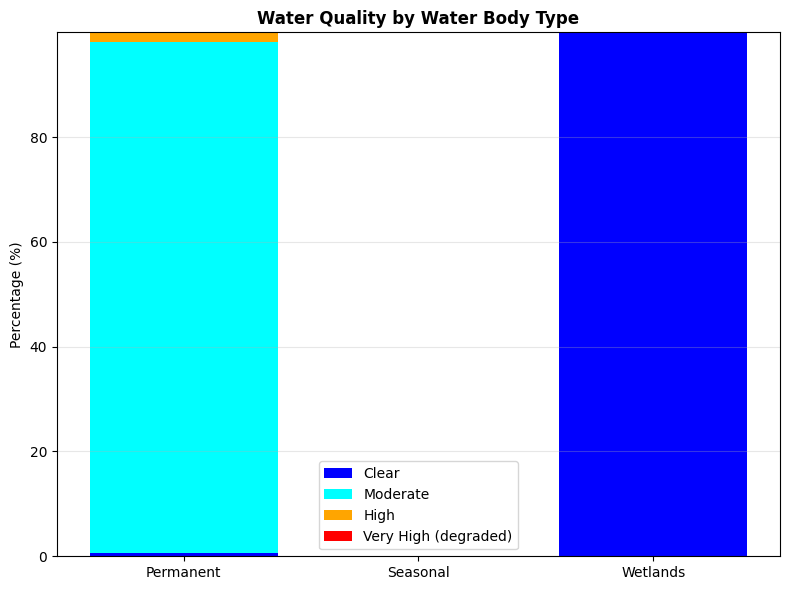

In [20]:
plot_quality_by_water_type(WATER_QUALITY_ANALYSIS)

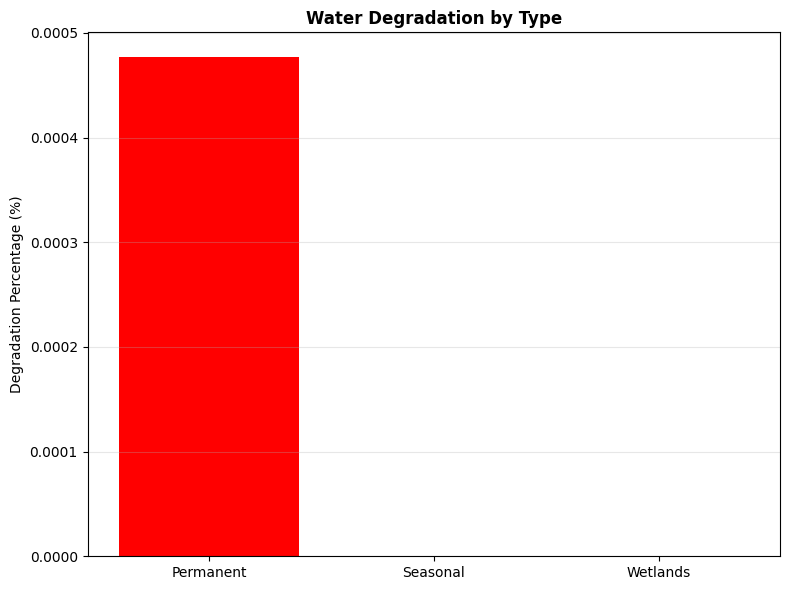

In [21]:
plot_degradation_analysis(DEGRADATION_ANALYSIS)

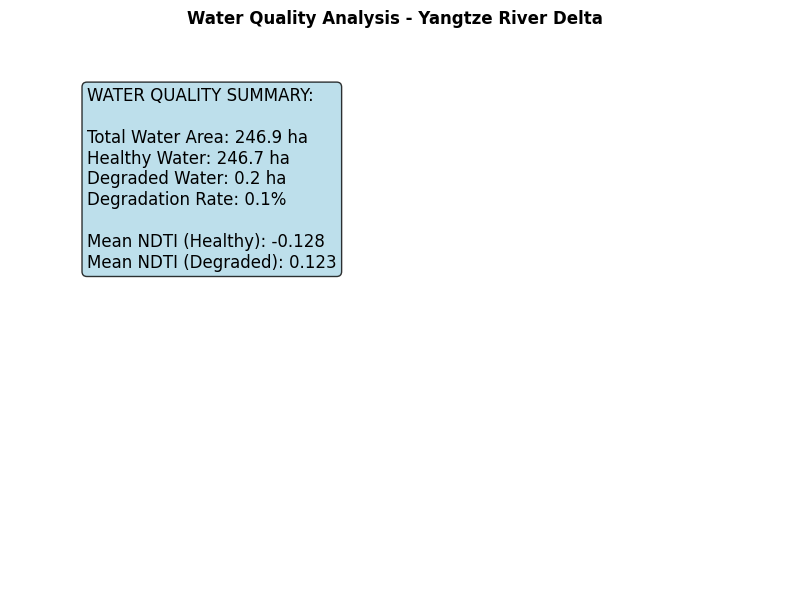

In [22]:
plot_water_quality_summary(DEGRADATION_ANALYSIS)

## Phase 8: Hydrological Analysis

Analysising the water data.

In [23]:
def create_riparian_buffers(water_classes: np.ndarray, 
                               transform: dict,
                               buffer_distances: list = [30, 100, 300]) -> dict:
    """
    Optimized riparian buffer creation using vectorized operations.
    """
    # Get pixel size in meters
    pixel_size_m = abs(transform[0])
    
    # Convert buffer distances to pixels
    buffer_pixels = [int(dist / pixel_size_m) for dist in buffer_distances]
    
    # Create water mask
    water_mask = (water_classes >= 1) & (water_classes <= 3)
    
    # If no water pixels, return empty buffers
    if not np.any(water_mask):
        return {f'buffer_{dist}m': np.zeros_like(water_mask, dtype=bool) for dist in buffer_distances}
    
    buffers = {}
    
    for dist_m, dist_px in zip(buffer_distances, buffer_pixels):
        print(f"Creating {dist_m}m buffer ({dist_px} pixels)...")
        
        # METHOD 1: Precompute distance template (fastest for small buffers)
        if dist_px <= 50:  # For smaller buffers, use template approach
            buffer_mask = _create_buffer_with_template(water_mask, dist_px)
        else:
            # METHOD 2: For larger buffers, use scipy.ndimage (much faster)
            buffer_mask = _create_buffer_with_dilation(water_mask, dist_px)
        
        buffers[f'buffer_{dist_m}m'] = buffer_mask
    
    return buffers

def _create_buffer_with_template(water_mask: np.ndarray, buffer_pixels: int) -> np.ndarray:
    """
    Fast buffer creation using precomputed distance template.
    """
    # Create a distance template once
    template_size = 2 * buffer_pixels + 1
    y_template, x_template = np.ogrid[-buffer_pixels:buffer_pixels+1, -buffer_pixels:buffer_pixels+1]
    distance_template = np.sqrt(y_template**2 + x_template**2) <= buffer_pixels
    
    # Use convolution-like approach but faster
    from scipy import ndimage # we only use scipy here to help us.
    
    buffer_mask = ndimage.binary_dilation(water_mask, structure=distance_template)
    
    return buffer_mask

def _create_buffer_with_dilation(water_mask: np.ndarray, buffer_pixels: int) -> np.ndarray:
    """
    Even faster for large buffers using iterative dilation.
    """
    from scipy import ndimage # and here.
    
    # Create circular structuring element
    y, x = np.ogrid[-buffer_pixels:buffer_pixels+1, -buffer_pixels:buffer_pixels+1]
    structure = (y**2 + x**2 <= buffer_pixels**2)
    
    buffer_mask = ndimage.binary_dilation(water_mask, structure=structure)
    
    return buffer_mask

def calculate_buffer_vegetation_quality(buffers: dict, 
                                      ndvi_array: np.ndarray) -> dict:
    """
    Calculate vegetation quality (NDVI) within each buffer zone.
    """
    buffer_stats = {}
    
    for buffer_name, buffer_mask in buffers.items():
        # Apply valid mask to buffer
        valid_buffer = buffer_mask & valid_mask_clipped
        
        if np.any(valid_buffer):
            buffer_ndvi = ndvi_array[valid_buffer]
            
            stats = {
                'area_pixels': np.sum(valid_buffer),
                'area_hectares': np.sum(valid_buffer) * 0.01,  # 10m pixels = 0.01 ha
                'ndvi_mean': np.mean(buffer_ndvi),
                'ndvi_median': np.median(buffer_ndvi),
                'ndvi_std': np.std(buffer_ndvi),
                'ndvi_min': np.min(buffer_ndvi),
                'ndvi_max': np.max(buffer_ndvi),
                'vegetation_quality': np.mean(buffer_ndvi)  # Simple quality metric
            }
        else:
            stats = {
                'area_pixels': 0,
                'area_hectares': 0,
                'ndvi_mean': 0,
                'ndvi_median': 0,
                'ndvi_std': 0,
                'ndvi_min': 0,
                'ndvi_max': 0,
                'vegetation_quality': 0
            }
        
        buffer_stats[buffer_name] = stats
    
    return buffer_stats

def assess_wetland_connectivity(water_classes: np.ndarray,
                              buffers: dict,
                              ndvi_array: np.ndarray,
                              transform: dict) -> dict:
    """
    Assess wetland connectivity using simple proximity and quality metrics.
    
    Connectivity = f(distance_to_water, corridor_quality, area_size)
    """
    # Get wetland areas (class 3)
    wetland_mask = (water_classes == 3) & valid_mask_clipped
    
    if not np.any(wetland_mask):
        return {'connectivity_score': 0, 'connected_wetlands': 0}
    
    # Calculate basic connectivity metrics
    connectivity_metrics = {}
    
    # 1. Wetland area (larger wetlands = higher connectivity)
    wetland_area_ha = np.sum(wetland_mask) * 0.01
    area_score = min(wetland_area_ha / 100.0, 1.0)  # Normalize to 0-1
    
    # 2. Corridor quality (NDVI in 100m buffer around wetlands)
    buffer_100m = buffers.get('buffer_100m', np.zeros_like(water_classes, dtype=bool))
    wetland_buffer = buffer_100m & ~wetland_mask & valid_mask_clipped
    
    if np.any(wetland_buffer):
        corridor_ndvi = np.mean(ndvi_array[wetland_buffer])
        quality_score = max(0, min(corridor_ndvi, 1.0))  # NDVI-based quality (0-1)
    else:
        quality_score = 0
    
    # 3. Proximity to permanent water
    permanent_water_mask = (water_classes == 1) & valid_mask_clipped
    if np.any(permanent_water_mask):
        # Simple proximity: percentage of wetlands near permanent water
        wetland_near_water = np.sum(wetland_mask & buffers['buffer_100m'])
        proximity_score = wetland_near_water / np.sum(wetland_mask) if np.sum(wetland_mask) > 0 else 0
    else:
        proximity_score = 0
    
    # Combined connectivity score
    connectivity_score = (area_score * 0.3 + quality_score * 0.4 + proximity_score * 0.3)
    
    connectivity_metrics = {
        'connectivity_score': connectivity_score,
        'area_score': area_score,
        'quality_score': quality_score,
        'proximity_score': proximity_score,
        'wetland_area_ha': wetland_area_ha,
        'corridor_quality_ndvi': quality_score,
        'wetlands_near_permanent_water': np.sum(wetland_mask & buffers['buffer_100m']) if 'buffer_100m' in buffers else 0
    }
    
    return connectivity_metrics

def identify_priority_conservation_areas(buffers: dict,
                                       ndvi_array: np.ndarray,
                                       water_classes: np.ndarray,
                                       biomass_array: np.ndarray) -> dict:
    """
    Identify priority conservation areas based on multiple criteria.
    """
    # Criteria weights
    weights = {
        'vegetation_quality': 0.4,
        'proximity_to_water': 0.3,
        'biomass_value': 0.3
    }
    
    # Initialize priority score array
    priority_scores = np.zeros_like(ndvi_array, dtype=np.float32)
    vegetation_score = np.clip(ndvi_array, 0, 1)
    water_proximity = np.zeros_like(ndvi_array, dtype=np.float32)
    
    # Assign higher scores to closer buffers
    if 'buffer_30m' in buffers:
        water_proximity[buffers['buffer_30m']] = 1.0
    if 'buffer_100m' in buffers:
        water_proximity[buffers['buffer_100m'] & ~buffers['buffer_30m']] = 0.7
    if 'buffer_300m' in buffers:
        water_proximity[buffers['buffer_300m'] & ~buffers['buffer_100m']] = 0.3
    
    max_biomass = np.max(biomass_array) if np.max(biomass_array) > 0 else 1
    biomass_score = biomass_array / max_biomass
    
    priority_scores = (
        vegetation_score * weights['vegetation_quality'] +
        water_proximity * weights['proximity_to_water'] +
        biomass_score * weights['biomass_value']
    )
    
    priority_scores[~valid_mask_clipped] = 0
    
    # Identify high priority areas
    priority_threshold = np.percentile(priority_scores[valid_mask_clipped], 80)
    high_priority_mask = (priority_scores >= priority_threshold) & valid_mask_clipped
    
    priority_areas = {
        'priority_scores': priority_scores,
        'high_priority_mask': high_priority_mask,
        'high_priority_area_ha': np.sum(high_priority_mask) * 0.01,
        'priority_threshold': priority_threshold,
        'max_priority_score': np.max(priority_scores),
        'mean_priority_score': np.mean(priority_scores[valid_mask_clipped])
    }
    
    return priority_areas

In [24]:
def plot_water_buffers(buffers: dict, water_classes: np.ndarray):
    """
    Plot 1: Water bodies and buffers as standalone figure.
    """
    plt.figure(figsize=(10, 8))
    
    water_display = np.where(valid_mask_clipped, water_classes, np.nan)
    cmap_water = plt.matplotlib.colors.ListedColormap(['lightgray', 'blue', 'cyan', 'green'])
    
    plt.imshow(water_display, cmap=cmap_water, vmin=0, vmax=3)
    
    for i, (buffer_name, buffer_mask) in enumerate(buffers.items()):
        buffer_display = np.where(buffer_mask & valid_mask_clipped, 1, np.nan)
        color = ['red', 'orange', 'yellow'][i] if i < 3 else 'pink'
        plt.imshow(buffer_display, cmap=plt.matplotlib.colors.ListedColormap([color]), alpha=0.3)
    
    plt.title('Water Bodies & Riparian Buffers\nYangtze River Delta', fontweight='bold', fontsize=14)
    plt.axis('off')
    
    legend_elements = [
        Patch(facecolor='blue', label='Permanent Water'),
        Patch(facecolor='cyan', label='Seasonal Water'),
        Patch(facecolor='green', label='Wetlands'),
        Patch(facecolor='red', alpha=0.3, label='30m Buffer'),
        Patch(facecolor='orange', alpha=0.3, label='100m Buffer'),
        Patch(facecolor='yellow', alpha=0.3, label='300m Buffer')
    ]
    plt.legend(handles=legend_elements, loc='upper right', fontsize=10)
    
    plt.tight_layout()
    plt.show()

def plot_buffer_vegetation_quality(buffer_stats: dict):
    """
    Plot 2: Buffer vegetation quality as standalone figure.
    """
    plt.figure(figsize=(8, 6))
    
    buffer_names = list(buffer_stats.keys())
    ndvi_means = [stats['ndvi_mean'] for stats in buffer_stats.values()]
    
    bars = plt.bar(buffer_names, ndvi_means, color=['red', 'orange', 'yellow'], alpha=0.7)
    plt.ylabel('Mean NDVI', fontsize=12)
    plt.title('Vegetation Quality in Riparian Buffers\nYangtze River Delta', fontweight='bold', fontsize=14)
    plt.grid(True, alpha=0.3, axis='y')
    
    for bar, ndvi in zip(bars, ndvi_means):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
                f'{ndvi:.3f}', ha='center', va='bottom', fontweight='bold')
    
    # Add some context
    plt.axhline(y=0.2, color='red', linestyle='--', alpha=0.5, label='Sparse vegetation threshold')
    plt.axhline(y=0.4, color='green', linestyle='--', alpha=0.5, label='Moderate vegetation threshold')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

def plot_connectivity_metrics(connectivity_metrics: dict):
    """
    Plot 3: Connectivity metrics as standalone figure.
    """
    plt.figure(figsize=(8, 6))
    
    connectivity_labels = ['Area Score', 'Quality Score', 'Proximity Score', 'Overall']
    connectivity_values = [
        connectivity_metrics['area_score'],
        connectivity_metrics['quality_score'], 
        connectivity_metrics['proximity_score'],
        connectivity_metrics['connectivity_score']
    ]
    
    colors = ['lightblue', 'lightgreen', 'lightcoral', 'gold']
    bars = plt.bar(connectivity_labels, connectivity_values, color=colors, alpha=0.7)
    plt.ylabel('Score', fontsize=12)
    plt.title('Wetland Connectivity Assessment\nYangtze River Delta', fontweight='bold', fontsize=14)
    plt.ylim(0, 1)
    plt.grid(True, alpha=0.3, axis='y')
    
    for bar, value in zip(bars, connectivity_values):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
                f'{value:.3f}', ha='center', va='bottom', fontweight='bold')
    
    plt.tight_layout()
    plt.show()

def plot_priority_areas(priority_areas: dict):
    """Plot priority conservation areas with professional styling"""
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    
    priority_display = np.where(valid_mask_clipped, priority_areas['priority_scores'], np.nan)
    im = ax.imshow(priority_display, cmap='YlOrRd', vmin=0, vmax=1)
    cbar = plt.colorbar(im, shrink=0.8)
    cbar.set_label('Priority Score', fontsize=17)
    cbar.ax.tick_params(labelsize=15)
    ax.axis('off')
    
    stats_text = f"""Priority Statistics:
Max score: {priority_areas['max_priority_score']:.3f}
Mean score: {priority_areas['mean_priority_score']:.3f}
High priority threshold: {priority_areas['priority_threshold']:.3f}"""
    
    ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, 
            verticalalignment='top', fontsize=18,
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.9))
    
    plt.tight_layout()
    plt.savefig("img/phase8.pdf", bbox_inches='tight')
    plt.show()

def plot_high_priority_overlay(priority_areas: dict, water_classes: np.ndarray):
    """
    Minimal version - just the visualization without any text annotations.
    """
    plt.figure(figsize=(10, 8))
    
    water_display = np.where(valid_mask_clipped, water_classes, np.nan)
    cmap_water = plt.matplotlib.colors.ListedColormap(['lightgray', 'blue', 'cyan', 'green'])
    
    plt.imshow(water_display, cmap=cmap_water, vmin=0, vmax=3, alpha=0.7)
    
    high_priority_display = np.where(priority_areas['high_priority_mask'] & valid_mask_clipped, 1, np.nan)
    plt.imshow(high_priority_display, cmap='Reds', alpha=0.7)
    
    plt.title('High Priority Conservation Areas', fontweight='bold', fontsize=14)
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

def plot_riparian_summary(buffer_stats: dict, connectivity_metrics: dict, priority_areas: dict):
    """
    Plot 6: Summary statistics as standalone figure.
    """
    plt.figure(figsize=(10, 8))
    
    # Create a text-based summary
    ndvi_means = [stats['ndvi_mean'] for stats in buffer_stats.values()]
    
    summary_text = f"""
RIPARIAN ANALYSIS SUMMARY
Yangtze River Delta

BUFFER AREAS:
• 30m buffer: {buffer_stats['buffer_30m']['area_hectares']:.1f} ha
• 100m buffer: {buffer_stats['buffer_100m']['area_hectares']:.1f} ha  
• 300m buffer: {buffer_stats['buffer_300m']['area_hectares']:.1f} ha
• Total buffered area: {sum(stats['area_hectares'] for stats in buffer_stats.values()):.1f} ha

VEGETATION QUALITY:
• Best buffer: {max(buffer_stats, key=lambda x: buffer_stats[x]['ndvi_mean'])}
• Worst buffer: {min(buffer_stats, key=lambda x: buffer_stats[x]['ndvi_mean'])}
• NDVI range: {min(ndvi_means):.3f} - {max(ndvi_means):.3f}
• Overall buffer NDVI: {sum(ndvi_means)/len(ndvi_means):.3f}

CONSERVATION PRIORITY:
• High priority area: {priority_areas['high_priority_area_ha']:.1f} ha
• Connectivity score: {connectivity_metrics['connectivity_score']:.3f}
• Area score: {connectivity_metrics['area_score']:.3f}
• Quality score: {connectivity_metrics['quality_score']:.3f}
• Proximity score: {connectivity_metrics['proximity_score']:.3f}
"""
    
    plt.axis('off')
    plt.text(0.05, 0.95, summary_text, transform=plt.gca().transAxes, 
             verticalalignment='top', fontsize=11, fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='lightgray', alpha=0.9))
    
    plt.title('Riparian Buffer Analysis - Comprehensive Summary', 
              fontweight='bold', fontsize=16, pad=20)
    
    plt.tight_layout()
    plt.show()

In [25]:
print("Creating riparian buffers...")
RIPARIAN_BUFFERS = create_riparian_buffers(WATER_CLASSES, REFERENCE_PROFILE['transform'])

Creating riparian buffers...
Creating 30m buffer (3 pixels)...


Python(24047) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Creating 100m buffer (10 pixels)...
Creating 300m buffer (30 pixels)...


In [26]:
print("Analyzing buffer vegetation quality...")
BUFFER_STATS = calculate_buffer_vegetation_quality(RIPARIAN_BUFFERS, NDVI)

Analyzing buffer vegetation quality...


In [27]:
BUFFER_STATS

{'buffer_30m': {'area_pixels': np.int64(5594965),
  'area_hectares': np.float64(55949.65),
  'ndvi_mean': np.float32(-0.09001132),
  'ndvi_median': np.float32(-0.1763429),
  'ndvi_std': np.float32(0.16557568),
  'ndvi_min': np.float32(-0.9980236),
  'ndvi_max': np.float32(0.7432073),
  'vegetation_quality': np.float32(-0.09001132)},
 'buffer_100m': {'area_pixels': np.int64(8821340),
  'area_hectares': np.float64(88213.40000000001),
  'ndvi_mean': np.float32(0.04707236),
  'ndvi_median': np.float32(0.009859165),
  'ndvi_std': np.float32(0.2412047),
  'ndvi_min': np.float32(-0.9980236),
  'ndvi_max': np.float32(0.7617758),
  'vegetation_quality': np.float32(0.04707236)},
 'buffer_300m': {'area_pixels': np.int64(14387418),
  'area_hectares': np.float64(143874.18),
  'ndvi_mean': np.float32(0.16616371),
  'ndvi_median': np.float32(0.19623233),
  'ndvi_std': np.float32(0.25892285),
  'ndvi_min': np.float32(-0.9980236),
  'ndvi_max': np.float32(0.7617758),
  'vegetation_quality': np.float32(

In [28]:
print("Assessing wetland connectivity...")
CONNECTIVITY_METRICS = assess_wetland_connectivity(WATER_CLASSES, RIPARIAN_BUFFERS, NDVI, REFERENCE_PROFILE['transform'])

Assessing wetland connectivity...


In [29]:
CONNECTIVITY_METRICS

{'connectivity_score': np.float64(0.3231182448798418),
 'area_score': np.float64(0.0143),
 'quality_score': np.float32(0.04707061),
 'proximity_score': np.float64(1.0),
 'wetland_area_ha': np.float64(1.43),
 'corridor_quality_ndvi': np.float32(0.04707061),
 'wetlands_near_permanent_water': np.int64(143)}

In [30]:
print("Identifying priority conservation areas...")
PRIORITY_AREAS = identify_priority_conservation_areas(RIPARIAN_BUFFERS, NDVI, WATER_CLASSES, BIOMASS_BOUNDED)

Identifying priority conservation areas...


In [31]:
PRIORITY_AREAS

{'priority_scores': array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32),
 'high_priority_mask': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'high_priority_area_ha': np.float64(49900.29),
 'priority_threshold': np.float32(0.43364537),
 'max_priority_score': np.float32(0.88292384),
 'mean_priority_score': np.float32(0.29105285)}

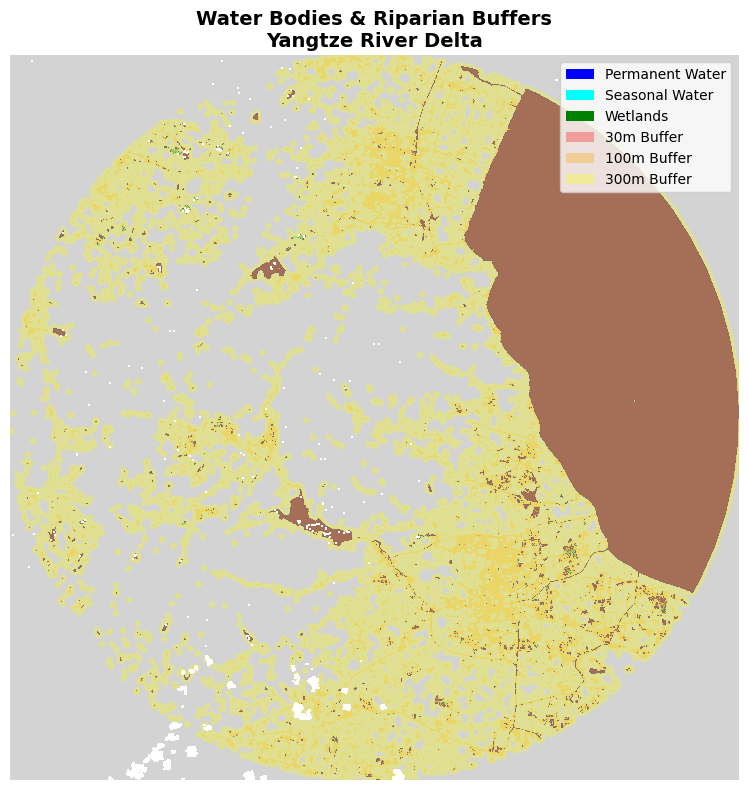

In [32]:
plot_water_buffers(RIPARIAN_BUFFERS, WATER_CLASSES)

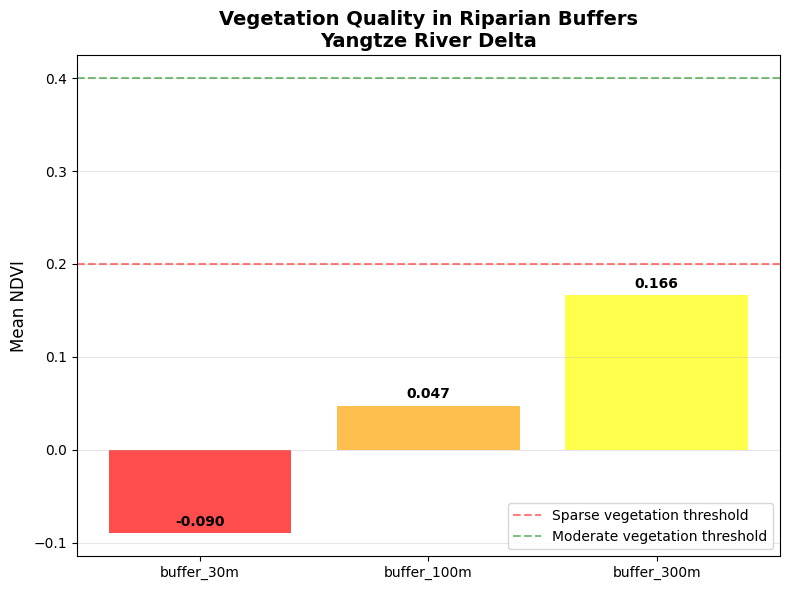

In [33]:
plot_buffer_vegetation_quality(BUFFER_STATS)

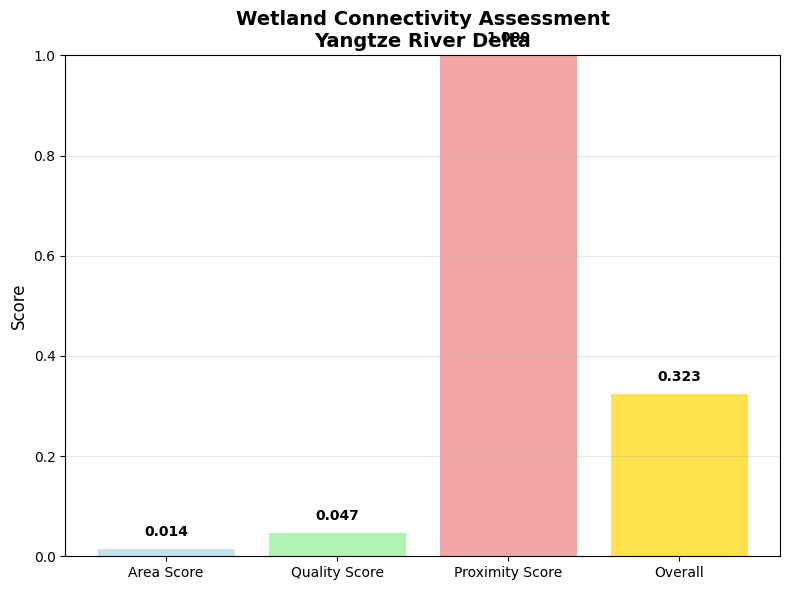

In [34]:
plot_connectivity_metrics(CONNECTIVITY_METRICS)

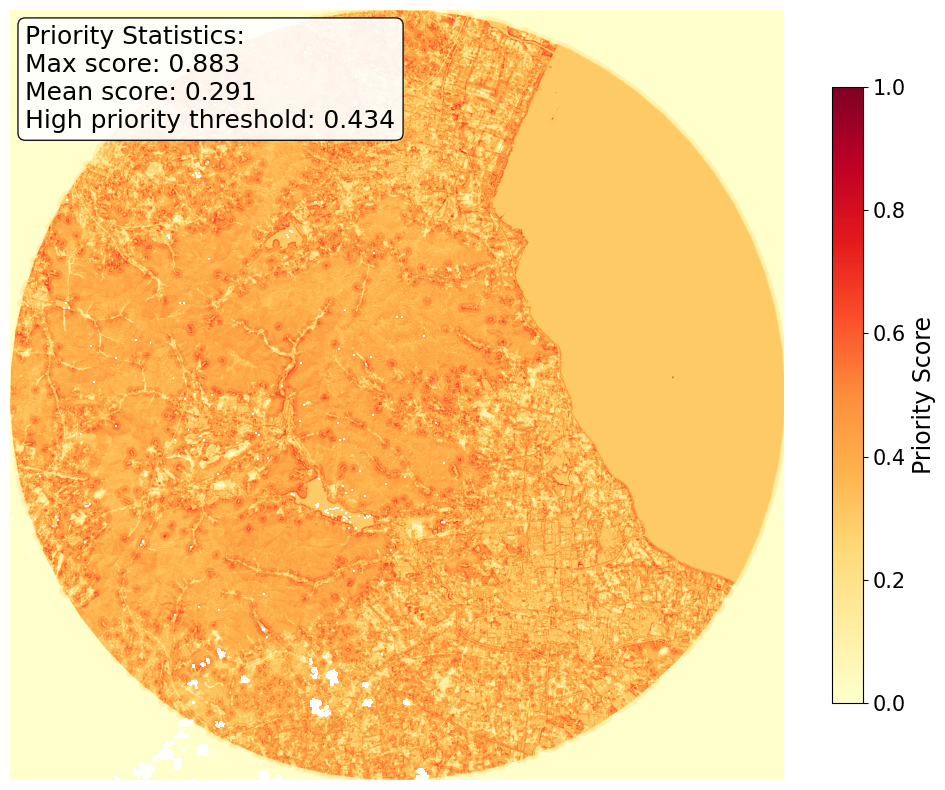

In [35]:
plot_priority_areas(PRIORITY_AREAS)

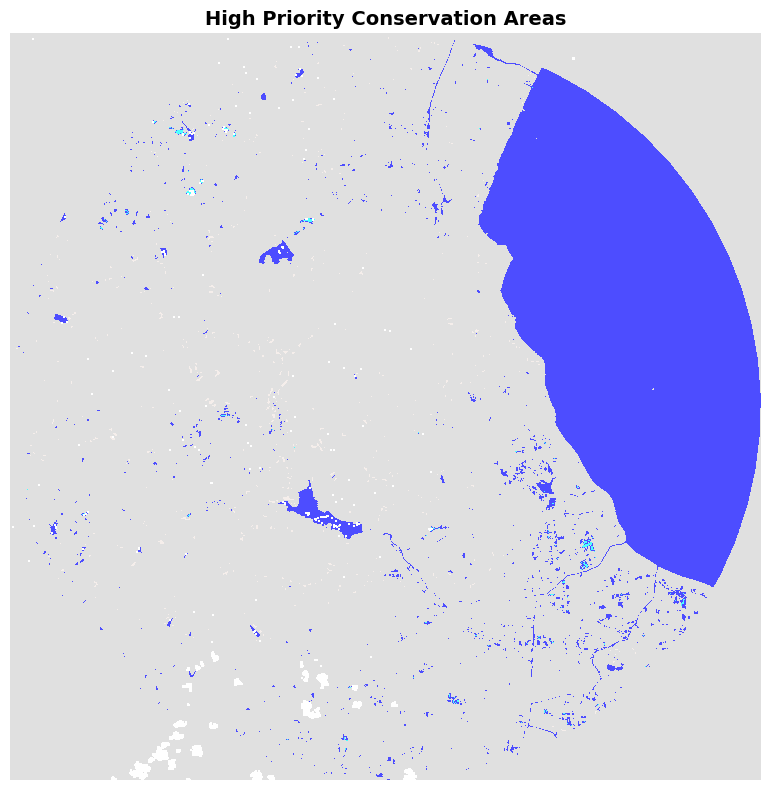

In [36]:
plot_high_priority_overlay(PRIORITY_AREAS, WATER_CLASSES)

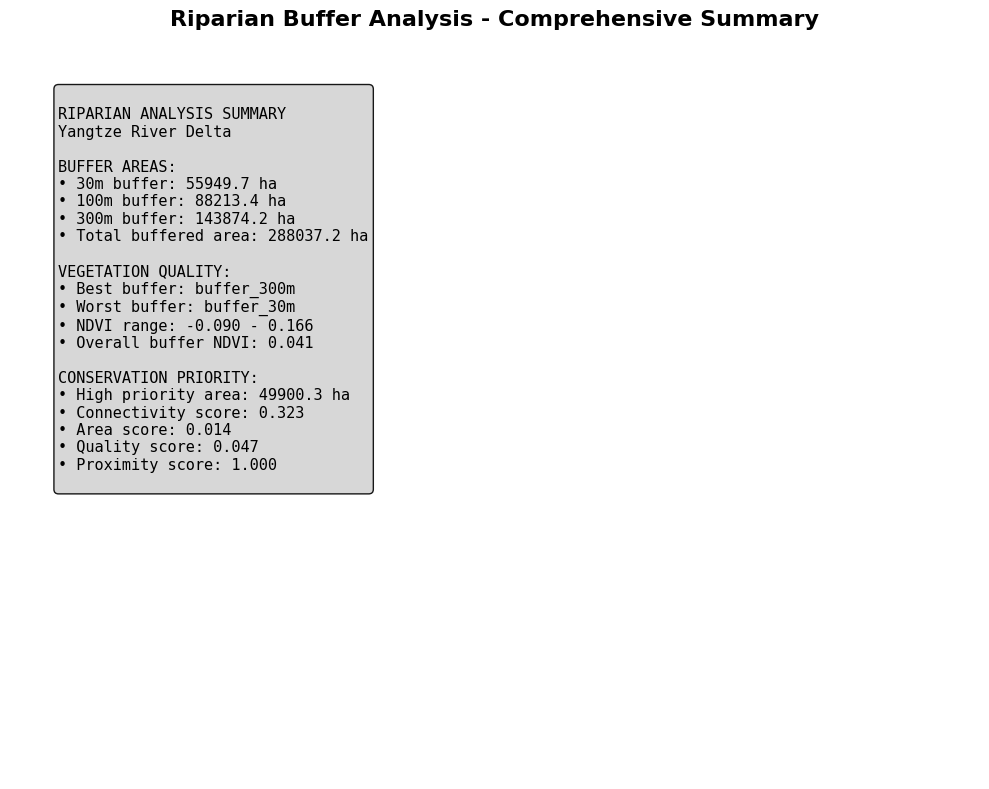

In [37]:
plot_riparian_summary(BUFFER_STATS, CONNECTIVITY_METRICS, PRIORITY_AREAS)

## Phase 9: Ecosystem Service Quantification

We compute here Water Flow Regulation, Water Purification, Sediment Control, Aquifer Recharge, and Flood Protection.

Calculating ecosystem services...
Generating service maps...


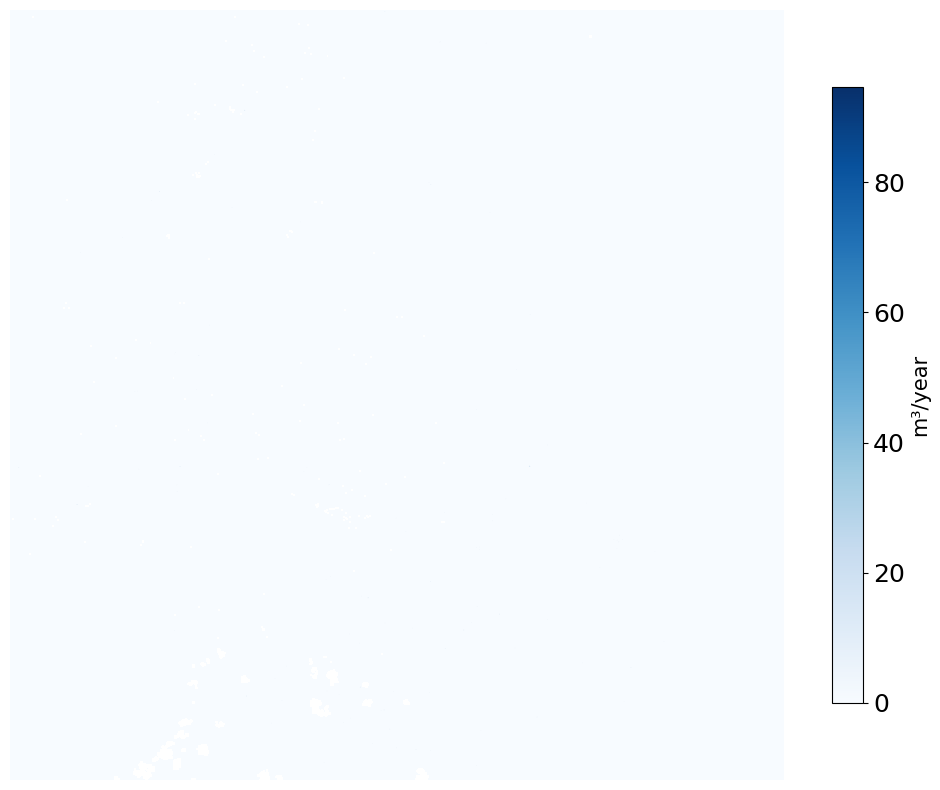

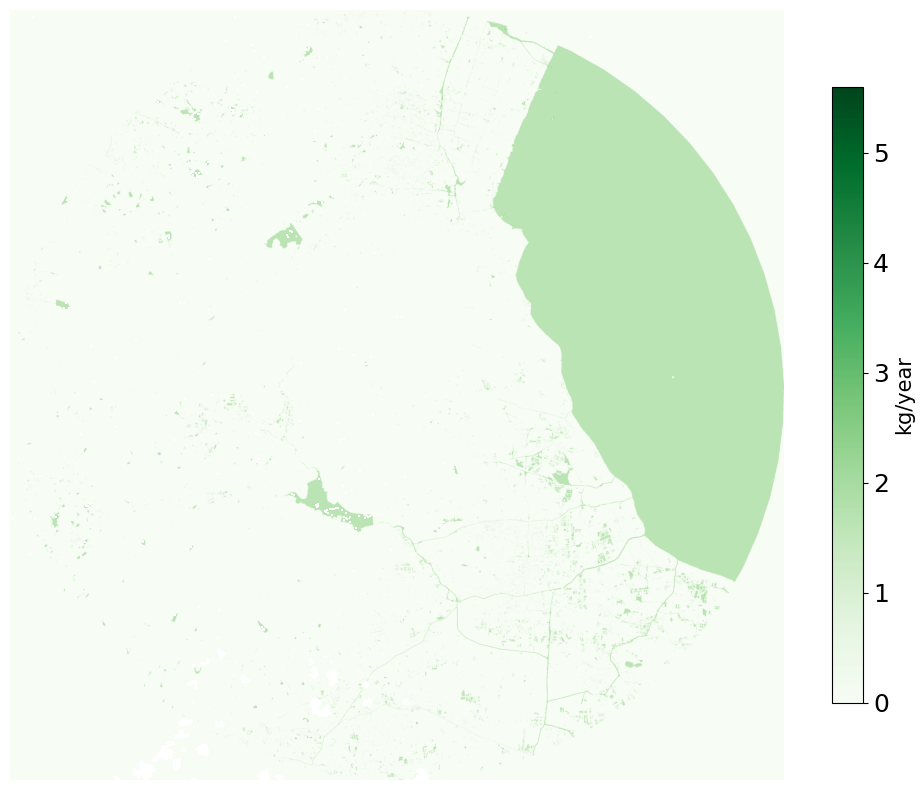

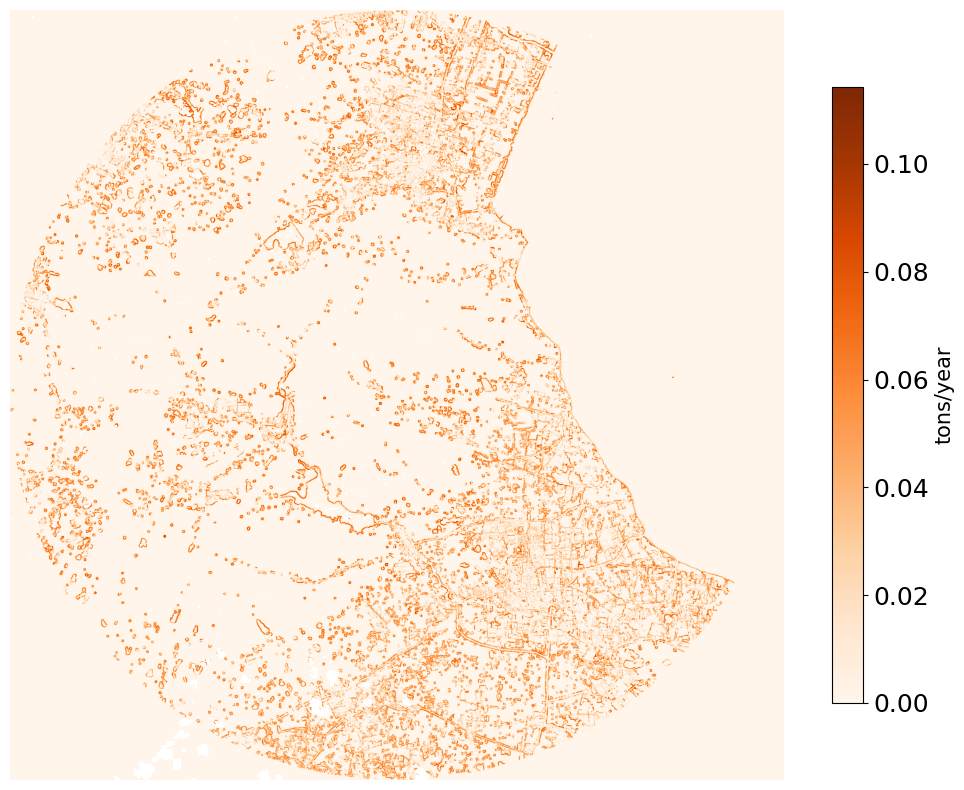

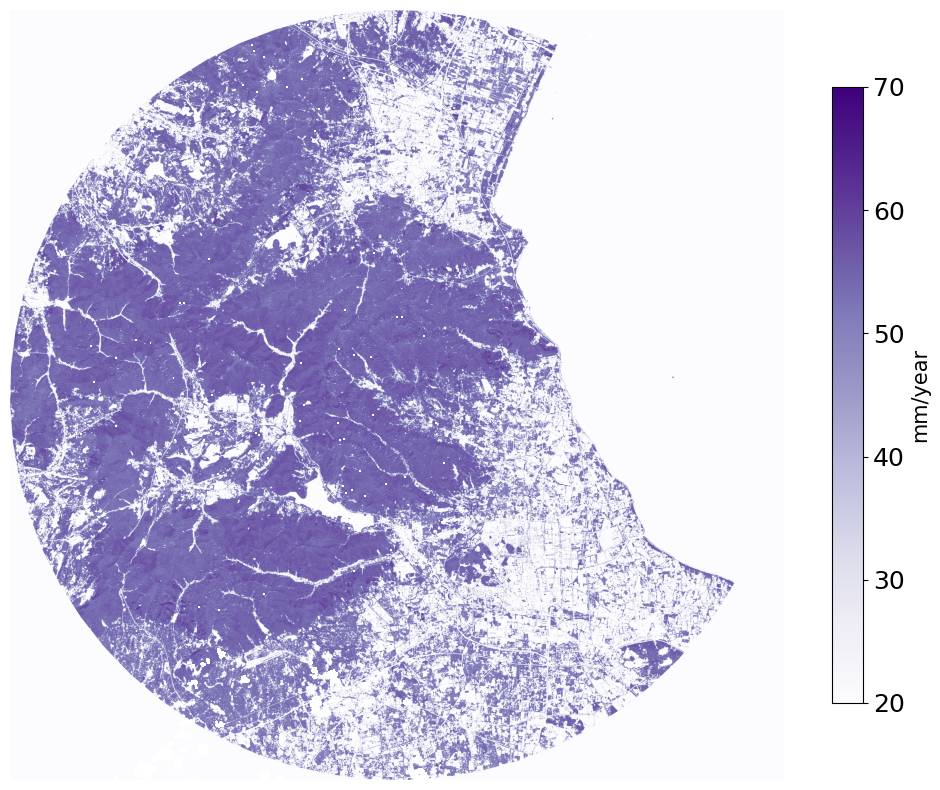

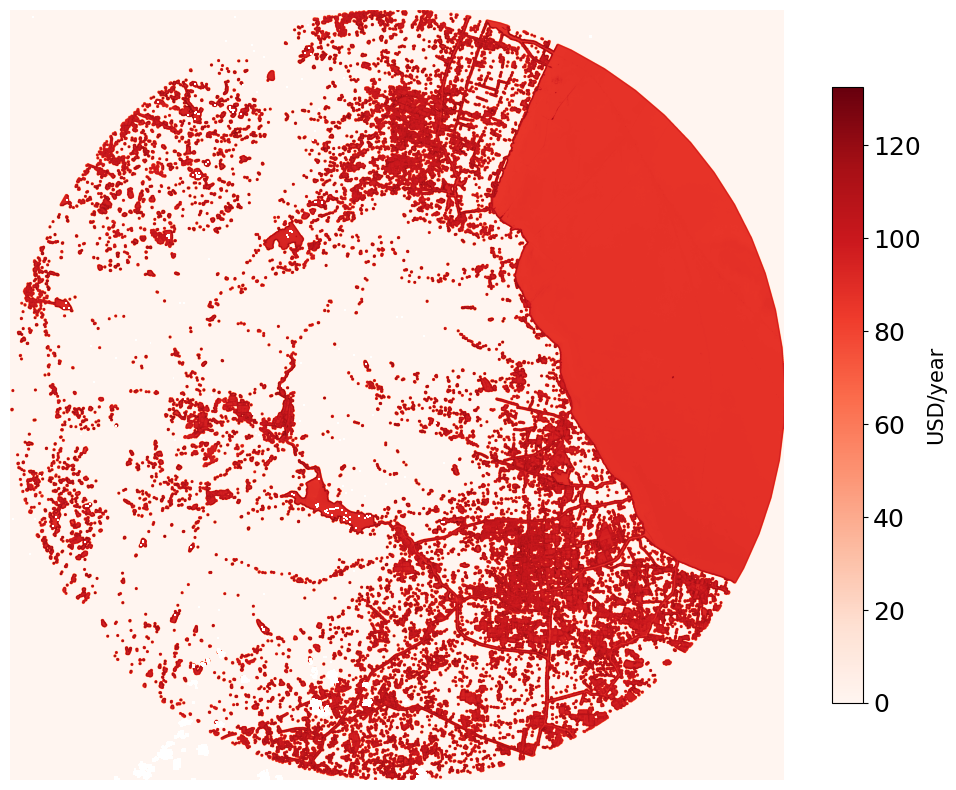

Identifying service hotspots...


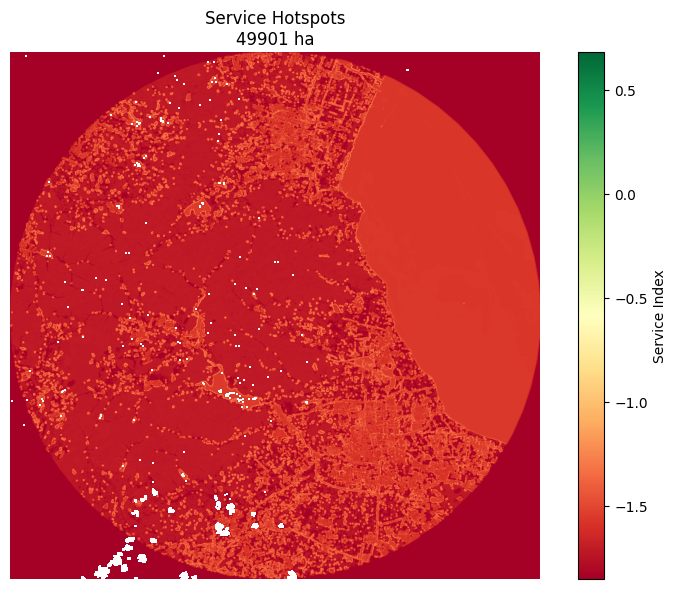


SERVICE SUMMARY:
----------------------------------------
flow_regulation.....       12,325 m³/year
purification........    7,073,139 kg/year
sediment_control....      143,474 tons/year
aquifer_recharge....  441,849,216 mm/year
flood_protection....  866,779,840 USD/year

Hotspots: 49901 ha (20.0% of area)


In [38]:
def calculate_ecosystem_services(water_classes, ndvi, riparian_buffers):
    """Calculate all 5 ecosystem services in one efficient function."""
    
    services = {}
    valid_area = valid_mask_clipped
    
    # 1. Water Flow Regulation (m³/year)
    wetland_mask = (water_classes == 3) & valid_area
    flow_map = np.zeros_like(ndvi, dtype=np.float32)
    flow_map[wetland_mask] = 0.01 * 1.0 * 0.8 * (1.0 + ndvi[wetland_mask] * 0.5) * 10000
    services['flow_regulation'] = {
        'map': flow_map, 'total': np.sum(flow_map), 'unit': 'm³/year'
    }
    
    # 2. Water Purification (kg/year)  
    water_mask = (water_classes >= 1) & (water_classes <= 3) & valid_area
    pur_map = np.zeros_like(ndvi, dtype=np.float32)
    pur_map[water_mask] = 800 * np.clip(ndvi[water_mask], 0.2, 1.0) * 0.01
    services['purification'] = {
        'map': pur_map, 'total': np.sum(pur_map), 'unit': 'kg/year'
    }
    
    # 3. Sediment Control (tons/year)
    buffer_100m = riparian_buffers.get('buffer_100m', np.zeros_like(ndvi, dtype=bool))
    sed_map = np.zeros_like(ndvi, dtype=np.float32)
    sed_mask = (ndvi > 0.2) & buffer_100m & valid_area
    sed_map[sed_mask] = 15.0 * ndvi[sed_mask] * 0.01
    services['sediment_control'] = {
        'map': sed_map, 'total': np.sum(sed_map), 'unit': 'tons/year'
    }
    
    # 4. Aquifer Recharge (m³/year)
    infil_map = np.zeros_like(ndvi, dtype=np.float32)
    infil_map[wetland_mask] = 0.7
    veg_mask = (ndvi > 0.3) & valid_area & ~wetland_mask
    infil_map[veg_mask] = 0.4 + (ndvi[veg_mask] * 0.3)
    infil_map[valid_area & ~wetland_mask & ~veg_mask] = 0.2
    recharge_vol = 1200.0 * infil_map * (1.0 - (1.0 - infil_map)) * 0.001 * 10000 * 0.01
    services['aquifer_recharge'] = {
        'map': infil_map * 100, 'total': np.sum(recharge_vol), 'unit': 'mm/year'
    }
    
    # 5. Flood Protection (USD/year)
    flood_mask = wetland_mask | (riparian_buffers.get('buffer_100m', False) & valid_area)
    flood_value = np.zeros_like(ndvi, dtype=np.float32)
    roughness = 0.8 + (ndvi * 0.4)
    flood_value[flood_mask] = 8000 * 0.01 * roughness[flood_mask] * 1.5
    services['flood_protection'] = {
        'map': flood_value, 'total': np.sum(flood_value), 'unit': 'USD/year'
    }
    
    return services

def plot_service_maps(services):
    """Create professional service maps without text annotations."""
    cmaps = {
        'flow_regulation': 'Blues',
        'purification': 'Greens', 
        'sediment_control': 'Oranges',
        'aquifer_recharge': 'Purples',
        'flood_protection': 'Reds'
    }
    
    for name, data in services.items():
        fig, ax = plt.subplots(1, 1, figsize=(10, 8))
        
        service_map = np.where(valid_mask_clipped, data['map'], np.nan)
        
        im = ax.imshow(service_map, cmap=cmaps[name])
        
        cbar = plt.colorbar(im, ax=ax, shrink=0.8)
        cbar.set_label(data['unit'], fontsize=15)
        cbar.ax.tick_params(labelsize=18) 
        ax.axis('off')
        
        plt.tight_layout()
        plt.savefig('img/phase9_'+name+'.pdf', bbox_inches='tight', dpi=300)
        plt.show()

def identify_hotspots(services):
    """Identify areas with multiple high-value services."""
    combined = np.zeros_like(valid_mask_clipped, dtype=np.float32)
    
    for data in services.values():
        valid_vals = data['map'][valid_mask_clipped & (data['map'] > 0)]
        if len(valid_vals) > 0:
            norm_map = (data['map'] - np.min(valid_vals)) / (np.max(valid_vals) - np.min(valid_vals))
            combined += np.where(valid_mask_clipped, norm_map, 0)
    
    combined /= len(services)
    hotspot_thresh = np.percentile(combined[valid_mask_clipped], 80)
    hotspot_mask = (combined >= hotspot_thresh) & valid_mask_clipped
    
    return {
        'map': combined,
        'mask': hotspot_mask,
        'area_ha': np.sum(hotspot_mask) * 0.01
    }

print("Calculating ecosystem services...")
SERVICES = calculate_ecosystem_services(WATER_CLASSES, NDVI, RIPARIAN_BUFFERS)

print("Generating service maps...")
plot_service_maps(SERVICES)

print("Identifying service hotspots...")
HOTSPOTS = identify_hotspots(SERVICES)

plt.figure(figsize=(8, 6))
hotspot_display = np.where(valid_mask_clipped, HOTSPOTS['map'], np.nan)
plt.imshow(hotspot_display, cmap='RdYlGn')
plt.colorbar(label='Service Index')
plt.title(f"Service Hotspots\n{HOTSPOTS['area_ha']:.0f} ha")
plt.axis('off')
plt.tight_layout()
plt.show()

print("\nSERVICE SUMMARY:")
print("-" * 40)
for name, data in SERVICES.items():
    print(f"{name:.<20} {data['total']:>12,.0f} {data['unit']}")

print(f"\nHotspots: {HOTSPOTS['area_ha']:.0f} ha ({HOTSPOTS['area_ha']/(np.sum(valid_mask_clipped)*0.01)*100:.1f}% of area)")

## Phase 10: Dynamic Ecosystem Service Valuation

Here, we derive quality, scarcity, and benefit multipliers from indices and contextual data. Finally, we ggregate to total annual value and unit value (per ha) for the AOI.

Converting to economic values...
Creating value distribution maps...
Generating valuation results...


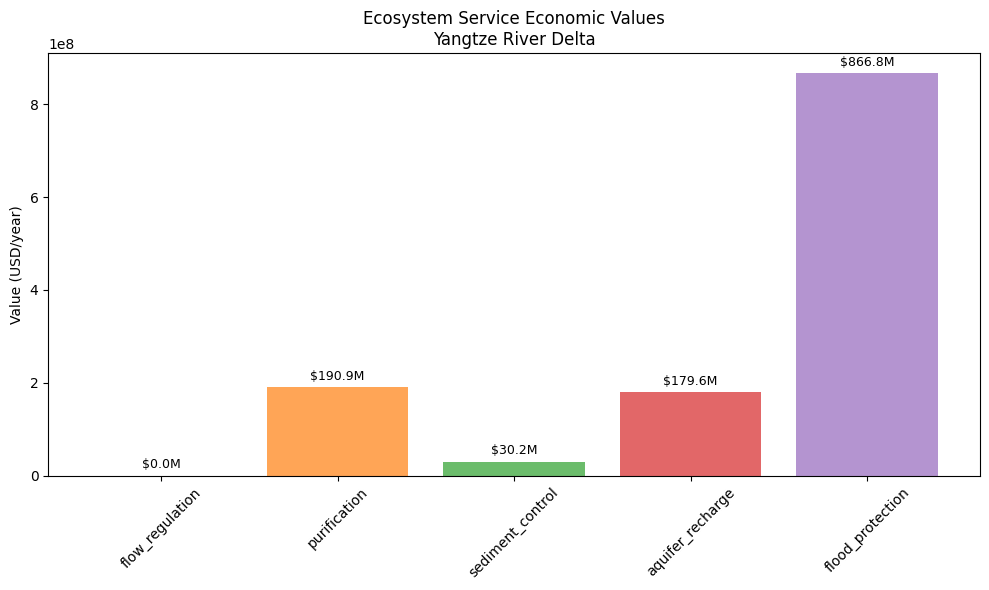

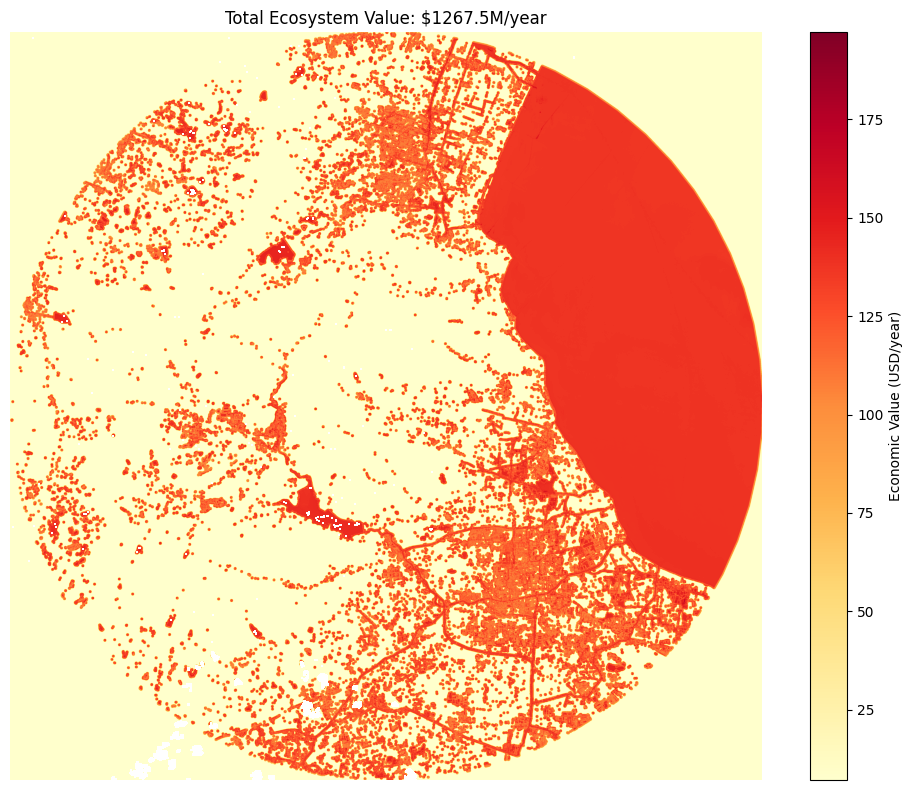


ECOSYSTEM SERVICE VALUATION SUMMARY
         Service Area (ha) Total Value (USD/yr) Value per ha (USD/yr)
 Flow Regulation         1               $3,089                $2,160
    Purification     44192         $190,909,181                $4,320
Sediment Control     26202          $30,184,808                $1,152
Aquifer Recharge    249500         $179,640,122                  $720
Flood Protection    249500         $866,779,840                $3,474
           TOTAL    569396       $1,267,517,040                $2,226

KEY METRICS:
• Total Annual Value: $1,267,517,040
• Value per hectare: $2,226/ha/year
• Hotspot Area: 49901 ha
• Hotspot Value: ~$111,082,972/year


In [39]:
def calculate_economic_value(services):
    """Convert biophysical services to economic values."""
    
    base_values = {
        'flow_regulation': 1500,
        'purification': 3000, 
        'sediment_control': 800,
        'aquifer_recharge': 500,
        'flood_protection': 8000  # Already in USD from Phase 9
    }
    
    # Adjustment factors
    quality_factor = 0.8  # Based on NDVI quality
    scarcity_factor = 1.2  # Water scarcity in region
    benefit_factor = 1.5  # High population downstream
    
    values = {}
    total_value = 0
    
    for name, data in services.items():
        if name == 'flood_protection':
            # Already calculated in USD
            economic_value = data['total']
        else:
            # Convert biophysical to economic
            area_ha = np.sum(data['map'] > 0) * 0.01
            if area_ha > 0:
                economic_value = (base_values[name] * area_ha * 
                                quality_factor * scarcity_factor * benefit_factor)
            else:
                economic_value = 0
        
        values[name] = {
            'value_usd': economic_value,
            'value_per_ha': economic_value / area_ha if area_ha > 0 else 0,
            'area_ha': area_ha
        }
        total_value += economic_value
    
    return values, total_value

def create_value_maps(services, economic_values):
    """Create economic value distribution maps."""
    
    value_map = np.zeros_like(valid_mask_clipped, dtype=np.float32)
    
    for name, data in services.items():
        if name == 'flood_protection':
            # Already economic values
            value_map += np.where(valid_mask_clipped, data['map'], 0)
        else:
            # Convert biophysical to economic value per pixel
            service_mask = data['map'] > 0
            if np.any(service_mask):
                pixel_value = economic_values[name]['value_usd'] / np.sum(service_mask)
                value_map[service_mask] += pixel_value
    
    return value_map

def plot_economic_results(economic_values, total_value, value_map):
    """Create simple economic visualization."""
    
    # Plot 1: Service values breakdown
    plt.figure(figsize=(10, 6))
    services = list(economic_values.keys())
    values = [economic_values[s]['value_usd'] for s in services]
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
    
    bars = plt.bar(services, values, color=colors, alpha=0.7)
    plt.ylabel('Value (USD/year)')
    plt.title('Ecosystem Service Economic Values\nYangtze River Delta')
    plt.xticks(rotation=45)

    for bar, value in zip(bars, values):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(values)*0.01,
                f'${value/1e6:.1f}M', ha='center', va='bottom', fontsize=9)
    
    plt.tight_layout()
    plt.show()
    
    # Plot 2: Value distribution map
    plt.figure(figsize=(10, 8))
    value_display = np.where(valid_mask_clipped, value_map, np.nan)
    plt.imshow(value_display, cmap='YlOrRd')
    plt.colorbar(label='Economic Value (USD/year)')
    plt.title(f'Total Ecosystem Value: ${total_value/1e6:.1f}M/year')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def generate_valuation_summary(economic_values, total_value, hotspots):
    """Create comprehensive valuation summary."""
    
    summary_data = []
    
    for service, data in economic_values.items():
        summary_data.append({
            'Service': service.replace('_', ' ').title(),
            'Area (ha)': f"{data['area_ha']:.0f}",
            'Total Value (USD/yr)': f"${data['value_usd']:,.0f}",
            'Value per ha (USD/yr)': f"${data['value_per_ha']:,.0f}"
        })
    
    # Add totals
    total_area = sum(data['area_ha'] for data in economic_values.values())
    summary_data.append({
        'Service': 'TOTAL',
        'Area (ha)': f"{total_area:.0f}",
        'Total Value (USD/yr)': f"${total_value:,.0f}",
        'Value per ha (USD/yr)': f"${total_value/total_area:,.0f}" if total_area > 0 else "$0"
    })
    
    df = pd.DataFrame(summary_data)
    
    print("\nECOSYSTEM SERVICE VALUATION SUMMARY")
    print("=" * 50)
    print(df.to_string(index=False))
    
    print(f"\nKEY METRICS:")
    print(f"• Total Annual Value: ${total_value:,.0f}")
    print(f"• Value per hectare: ${total_value/total_area:,.0f}/ha/year" if total_area > 0 else "• Value per hectare: $0")
    print(f"• Hotspot Area: {hotspots['area_ha']:.0f} ha")
    print(f"• Hotspot Value: ~${total_value * (hotspots['area_ha']/total_area):,.0f}/year" if total_area > 0 else "• Hotspot Value: $0")

print("Converting to economic values...")
ECONOMIC_VALUES, TOTAL_VALUE = calculate_economic_value(SERVICES)

print("Creating value distribution maps...")
VALUE_MAP = create_value_maps(SERVICES, ECONOMIC_VALUES)

print("Generating valuation results...")
plot_economic_results(ECONOMIC_VALUES, TOTAL_VALUE, VALUE_MAP)
generate_valuation_summary(ECONOMIC_VALUES, TOTAL_VALUE, HOTSPOTS)

# Store final results
FINAL_RESULTS = {
    'economic_values': ECONOMIC_VALUES,
    'total_value': TOTAL_VALUE,
    'value_map': VALUE_MAP,
    'valuation_summary': {
        'total_annual_value': TOTAL_VALUE,
        'services': ECONOMIC_VALUES,
        'hotspots': HOTSPOTS
    }
}